<span style="font-size:18px; color:red; font-weight:bold">Churn Bancario, construyendo un modelo de Machine Learning en Python</span>

**Enrique Aranaz Tudela**

LInkedin: www.linkedin.com/in/enrique-aranaz-tudela

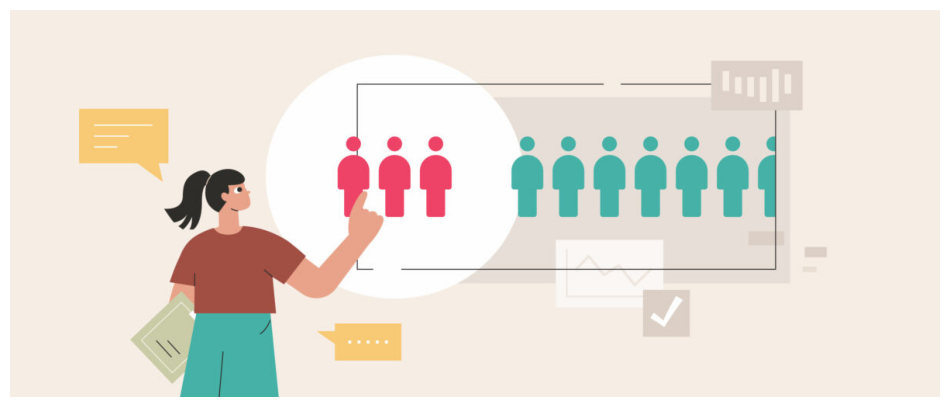

In [26]:
mostrar_imagen('c:/Phyton/Churn.jpeg')

<span style="font-size:24px; color:red; font-weight:bold">Indice</span>

<span style="font-size:18px; color:red; font-weight:bold">0. Importación de librerias a utilizar y definición de funciones</span>

<span style="font-size:18px; color:red; font-weight:bold">1. Definición del problema</span>

    1.1 Introducción al problema que queremos abordar
    1.2 Descripción del dataset y sus variables

<span style="font-size:18px; color:red; font-weight:bold">2. Preparación de los datos</span>

    2.1 Importación de librerias a utilizar
    2.2 Carga del dataset y descripción de los datos
    2.3 Data Cleaning 

        2.3.1 Identificación valores nulos, duplicados, valores no utiles para el modelo o con poca varianza
        2.3.2 Analisis descriptivo univariante y bivariante
        2.3.3 Identificación de valores atípicos y definición de estrategias con ellos
        2.3.4 Data Transforms: Cambiando la escala o distribución de las variables

    2.4 Feature Selection: Identificación de las variables más relevantes

        2.4.1 Filter Methods: Correlación, Chi-cuadrado y Anova
        2.4.2 Filter Methods empleando el metodo K-best
        2.4.3 Embedded Methods: RandomForest

        2.4.4 Conclusiones Feature Selection

    2.5 Reducción de la dimensionalidad de los datos
    2.6 Feature engineering: Creación de nuevas variables

<span style="font-size:18px; color:red; font-weight:bold">3. Entrenamiento y evaluación de modelos</span>

    3.1 Elección de algoritmos de machine learning adecuados para el problema.
    3.2 Aplicación de RamdonOverSampler para corregir problema de desequilibrio. 
    3.3 Entrenamiento de los modelos y evaluación de su rendimiento. 
    3.4 Selección de los dos mejores modelos y optimización (ajuste hiperparámetros).

<span style="font-size:18px; color:red; font-weight:bold">4. Modelo final</span>

    4.1 Añadir las probabilidades obtenidas por el modelo al dataset
    4.2 Segmentación de nuestra cartera de clientes y descripción de cada segmento en función de las características más relevantes

<span style="font-size:18px; color:red; font-weight:bold">5. Conclusiones y recomendaciones</span>


<span style="font-size:24px; color:red; font-weight:bold">0. Importación de librerias a utilizar y definición de funciones</span>

In [1]:
# Librerias básicas:
import numpy as np
import pandas as pd
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import pylab
import matplotlib.ticker as mtick
import matplotlib.image as mpimg
from scipy.stats import shapiro, normaltest, kstest, jarque_bera
from scipy.stats import probplot
from scipy.stats import stats
from scipy.stats import mstats

# Feature Selection, Preprocesado, Modelos, Métricas, GridSearch:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif
from sklearn.linear_model import LogisticRegressionCV 
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score, recall_score,f1_score,accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import load_digits

from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.metrics import Precision, Recall

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Funciones vamos a utilizar

def plot_vector_charts(vector_cols, titulo):
    # Definir una paleta de colores personalizada
    color_palette = ["#800000", "#8000ff", "#6aac90", "#5833ff", "#da8829"]
    color_pastel = ["#53D021", "#EB2325"]
    bar_palette = {0: 'blue', 1: 'red'}
    colors = ["#53D021", '#EB2325']
    
    # Configurar la figura con constrained_layout
    fig, axes = plt.subplots(len(vector_cols), 2, figsize=(16, 8))  # Aumentar el ancho de la figura
    fig.patch.set_facecolor("#ffe6e6")

    # Título del gráfico
    fig.suptitle(titulo, fontsize=10, fontweight='bold', fontfamily='serif', color="#000000")

    # Crear gráficos de pastel y de barras para cada columna categórica
    for i, col in enumerate(vector_cols):
        # Gráfico de pastel
        pie_ax = axes[i, 0]
        (df[col].value_counts() * 100.0 / len(df)).plot.pie(
            autopct=lambda p: f'{p:.1f}%', fontsize=8, ax=pie_ax, colors=color_palette, textprops={'color': 'black'})
        pie_ax.set_ylabel('')
        pie_ax.set_title(col, fontsize=8, backgroundcolor='skyblue')

        # Agrupar datos por la columna actual y estado de salida
        churn_data = df.groupby([col, 'Exited']).size().unstack()

        # Crear gráfico de barras apiladas
        bar_ax = axes[i, 1]
        ax = churn_data.plot(kind='bar', stacked=True, color=colors, rot=0, ax=bar_ax)
        ax.legend(labels=['Stayed', 'Churned'], fontsize=8)  # Tamaño de la leyenda reducido
        ax.set_title(f'{col} Distribution and Churn rate', fontsize=8)  # Tamaño del título reducido
        ax.set_ylabel('Customer Count')

        # Añadir anotaciones de porcentaje
        for p in ax.patches:
            w, h = p.get_width(), p.get_height()
            x, y = p.get_xy()
            if x == -0.25:
                col_sum = churn_data.T.sum().iloc[0]
            else:
                col_sum = churn_data.T.sum().iloc[1]

            temp = np.array(round(h * 100 / col_sum, 1))  # Redondear a un decimal
            anot = str(temp)
            ax.annotate(anot + '%', (x + 0.15, y + h / 2), color='white', weight='bold', size=8)  # Tamaño de fuente reducido

        # Añadir líneas discontinuas al eje y
        ax.grid(color='#000000', linestyle=':', axis='y', zorder=0, dashes=(1, 5))

    # Ajustar manualmente el diseño para aumentar el espacio vertical entre gráficos
    plt.subplots_adjust(hspace=0.6, wspace=0.2)  # Reducir el espacio horizontal entre subplots
    plt.show()

def mostrar_imagen(ruta_imagen):
    img = mpimg.imread(ruta_imagen)
    plt.figure(figsize=(12, 10))
    imgplot = plt.imshow(img)
    plt.axis('off')  # Desactivar los ejes
    plt.show()

def plot_chart(titulo):

    # Configurar la figura
    fig, ax = plt.subplots(figsize=(8, 4))
    background_color = "#ffe6e6"
    fig.patch.set_facecolor(background_color)
    ax.set_facecolor(background_color)

    # Crear el gráfico de barras horizontal
    sns.barplot(x='f1_score', y='Modelo', hue='Modelo', data=Model_com_df, ax=ax, palette='viridis', legend=False)

    # Añadir etiquetas y título
    ax.set_title(titulo, fontsize=10, fontweight='bold')
    ax.set_xlabel('f1_score', fontsize=12)
    ax.set_ylabel('Modelo', fontsize=12)

    # Añadir valores de f1_score a las barras con un decimal
    for p in ax.patches:
        width = p.get_width()
        ax.annotate(f'{width:.2f}', xy=(width, p.get_y() + p.get_height() / 2),
                xytext=(3, 0), textcoords="offset points", fontsize=8, fontweight='bold')

    # Mostrar el gráfico
    plt.show()

def evaluationModel(y_test, y_pred):
    # Calcular la matriz de confusión
    cn = confusion_matrix(y_test, y_pred)
    
    # Calcular el porcentaje de cada celda sobre el total de la fila
    cn_percent = cn / cn.sum(axis=1, keepdims=True) * 100
    
    # Nombres personalizados para las celdas
    names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    
    # Crear anotaciones combinadas de nombres, números absolutos y porcentajes
    combined_labels = np.array([f'{name}\n{value}\n{percent:.2f}%' for name, value, percent in zip(names, cn.flatten(), cn_percent.flatten())]).reshape(2, 2)
    
    # Crear el heatmap
    sns.heatmap(cn, annot=combined_labels, fmt='', cmap='Blues', cbar=False, xticklabels=['Predicted No Churn', 'Predicted Churn'], yticklabels=['Actual No Churn', 'Actual Churn'])
    
    # Añadir etiquetas y título
    plt.xlabel('Predicted Label')  
    plt.ylabel('True Label')  
    plt.title('Confusion Matrix') 
    plt.show()

<span style="font-size:24px; color:red; font-weight:bold">1. Definición del problema</span>

### 1.1 Introducción al problema que queremos abordar

La **pérdida de clientes**, consecuencia de la acelerada transformación bancaria y del resurgimiento de nuevos competidores, **es uno de los principales problemas que afronta la banca actual con impacto significativo en su rentabilidad.** 

**Dos son los objetivos de este proyecto:**  

 1) Desarrollar un modelo de predicción del churn que permita comprender los factores más determinantes en la fuga de clientes. 

 2) Utilizar dicho modelo para predecir una probabilidad de churn para nuestra cartera de clientes que nos permita anticiparnos con acciones destinadas a mitigarlo, muy en especial, de forma específica, en los clientes más valiosos para la compañía.

**Para realizar el proyecto se emplearan técnicas de Machine Learning utilizando el lenguaje de ciencia de datos Python**, lo que nos permitirá abordar el problema en todas sus fases, desde la preparación de los datos a la evaluación de distintos modelos y la selección final del más adecuado al objetivo buscado, **creando así una metodología eficiente y automatizable que permita replicarse de forma ágil sobre nuestra cartera de clientes a lo largo del tiempo**, ajustándose el modelo en función de nuevas variables disponibles y/o de cambios en el comportamiento respecto al churn de los clientes.


### 1.2 Descripción del dataset y sus variables

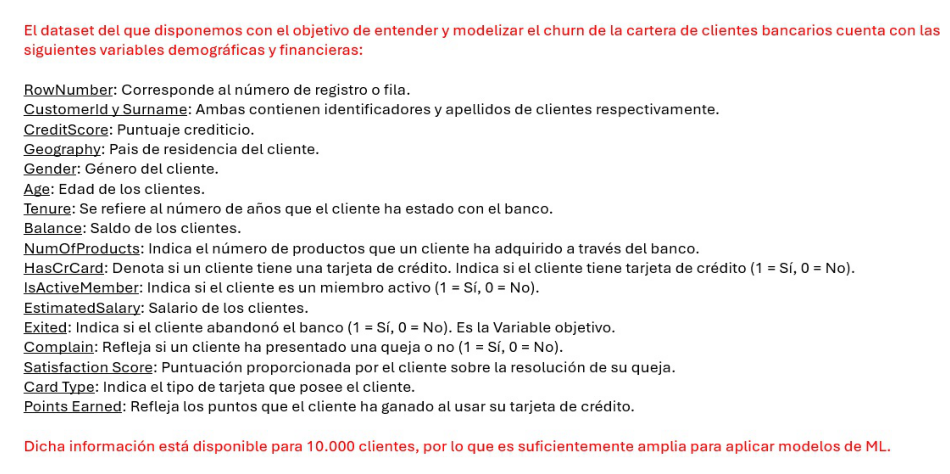

In [36]:
mostrar_imagen('c:/Phyton/DescripcionDF.jpg')

<span style="font-size:24px; color:red; font-weight:bold">2. Preparación de los datos</span>

### 2.2 Carga del dataset y descripción de los datos

In [3]:
# Importamos Dataset
df=pd.read_csv('c:/Phyton/Customer-Churn-Records.csv')
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,1,2,DIAMOND,464
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,1,3,DIAMOND,456
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,1,3,DIAMOND,377
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,0,5,GOLD,350
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,0,5,GOLD,425


### 2.3 Data Cleaning 

### 2.3.1 Identificación valores nulos, duplicados, valores no utiles para el modelo o con poca varianza

In [4]:
# dimension de los datos
print("El tamaño del dataset es : ", df.shape)
print("")

# Eliminamos columnas innecesarias
df=df.drop(columns = ['CustomerId','RowNumber', 'Surname'],axis=1)

#Cambiamos nombres columnas con espacios
df.columns = df.columns.str.replace(' ', '_')

# Chequear valores duplicados
print("---- Duplicados ----")
print("Número de duplicados: " + str(df.duplicated().sum()))
print("")

#Valores nulos
dict = {}
for i in list(df.columns):
    dict[i] = df[i].isnull().mean() * 100

df_nulos=pd.DataFrame(dict,index=["Valores nulos"]).transpose()

#Valores únicos
dict = {}
for i in list(df.columns):
    dict[i] = df[i].value_counts().shape[0]

df_unicos=pd.DataFrame(dict,index=["Valores únicos"]).transpose()

#Valores missing
dict = {}
for i in list(df.columns):
    dict[i] = df[i].isna().mean() * 100
    
df_miss=pd.DataFrame(dict,index=["Valores missing"]).transpose()

#type variable
dict = {}
for i in list(df.columns):
    dict[i] = df[i].dtype
    
df_type=pd.DataFrame(dict,index=["Type"]).transpose()

# Concatenar 
pd.concat([df_unicos,df_nulos,df_miss, df_type ], axis=1)

El tamaño del dataset es :  (10000, 18)

---- Duplicados ----
Número de duplicados: 0



,Valores únicos,Valores nulos,Valores missing,Type
CreditScore,460,0.0,0.0,int64
Geography,3,0.0,0.0,object
Gender,2,0.0,0.0,object
Age,70,0.0,0.0,int64
Tenure,11,0.0,0.0,int64
Balance,6382,0.0,0.0,float64
NumOfProducts,4,0.0,0.0,int64
HasCrCard,2,0.0,0.0,int64
IsActiveMember,2,0.0,0.0,int64
EstimatedSalary,9999,0.0,0.0,float64


### 2.3.2 Analisis descriptivo univariante y bivariante

Vamos a dividir las variables en binarias, categoricas, numéricas discretas y numéricas continuas.

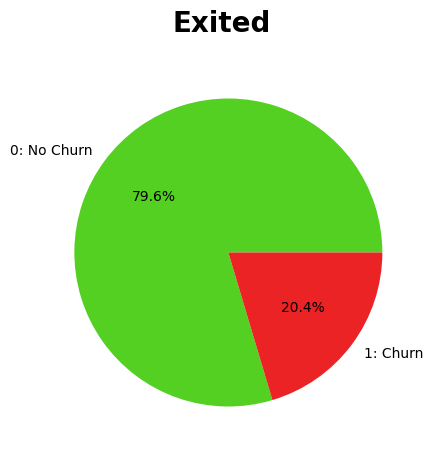

In [9]:
# a) Variable Objetivo

# Visualizamos la variable objetivo para ver si esta balanceada
# Definir los colores
colors = ["#53D021", "#EB2325"]

# Definir las etiquetas
labels = ['0: No Churn', '1: Churn']

# Crear la figura
plt.figure(figsize=(5, 5))
plt.suptitle("Exited", fontweight="bold", fontsize=20)

# Crear el gráfico de pastel con los colores definidos
plt.pie(x=df['Exited'].value_counts().values, labels=labels, colors=colors, autopct='%.1f%%')

# Mostrar el gráfico
plt.show()

In [11]:
# b) Variables binarias, excepto la variable objetivo

binary_cols = [col for col in df.columns if df[col].nunique() == 2 and col != 'Exited' and df[col].dtype != 'object']
df_binary_cols= df[binary_cols]

# c) Variables categoricas
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
df_categorical_cols = df[categorical_cols]

# d) Variables discretas
# Seleccionar columnas numéricas con menos de 12 valores únicos y más de 2 valores únicos
numerical_columns = df.select_dtypes(include=['number']).columns
discretas_cols = [col for col in numerical_columns if 2 < df[col].nunique() < 12]
discretas_cols

# e) Variables numéricas continuas  (con >=12 valores unicos)
numerical_columns = df.select_dtypes(include=['number']).columns
numerical_cont_cols = [col for col in numerical_columns if df[col].nunique() >= 12]
df_numerical_cont_cols = df[numerical_cont_cols]

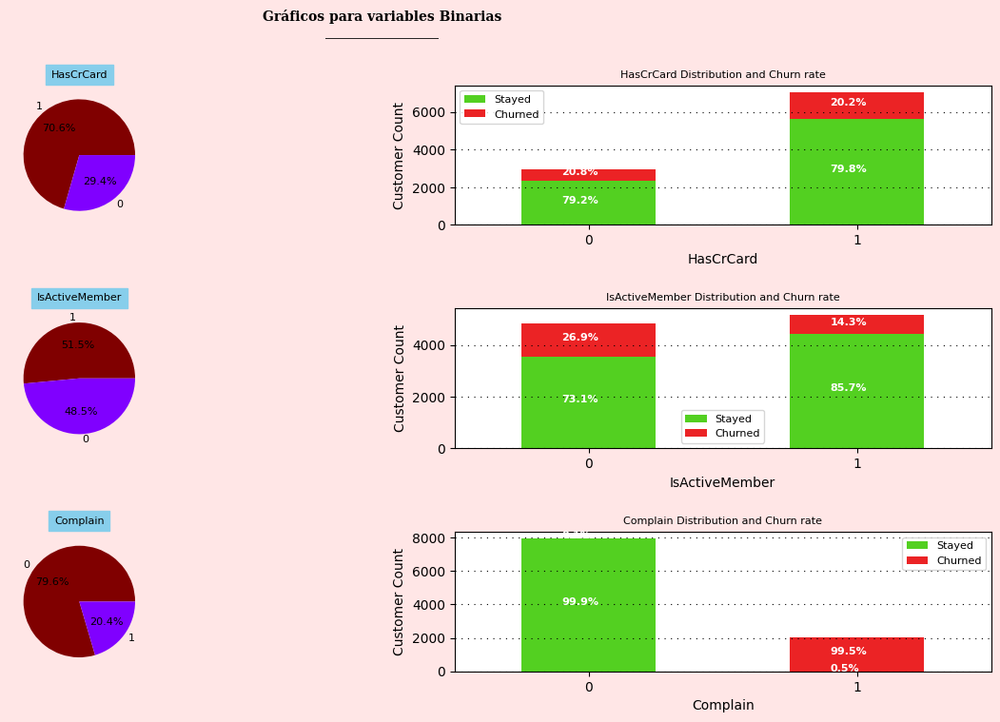

In [13]:
titulo = 'Gráficos para variables Binarias\n_________________'
plot_vector_charts(binary_cols, titulo)

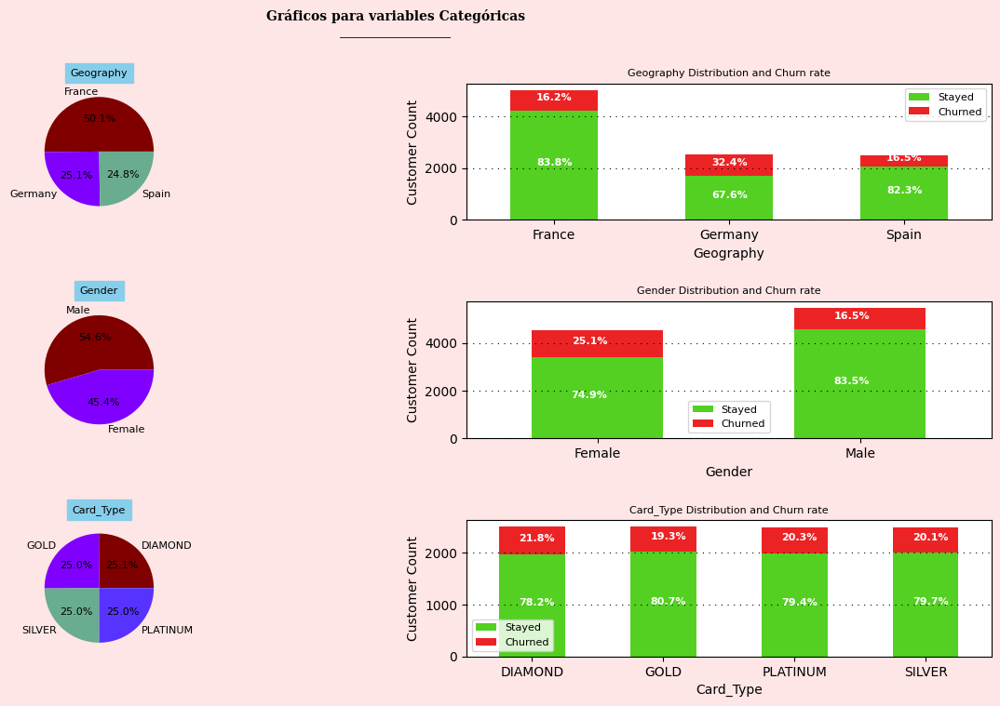

In [15]:
titulo = 'Gráficos para variables Categóricas\n_________________'
plot_vector_charts(categorical_cols, titulo)

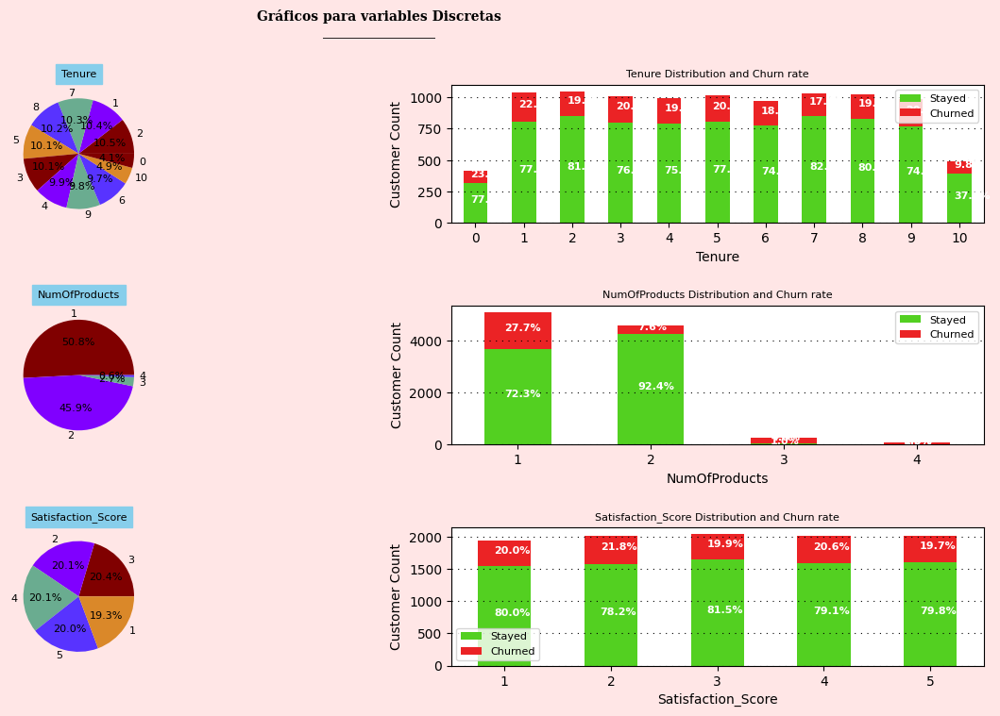

In [17]:
titulo = 'Gráficos para variables Discretas\n_________________'
plot_vector_charts(discretas_cols, titulo)

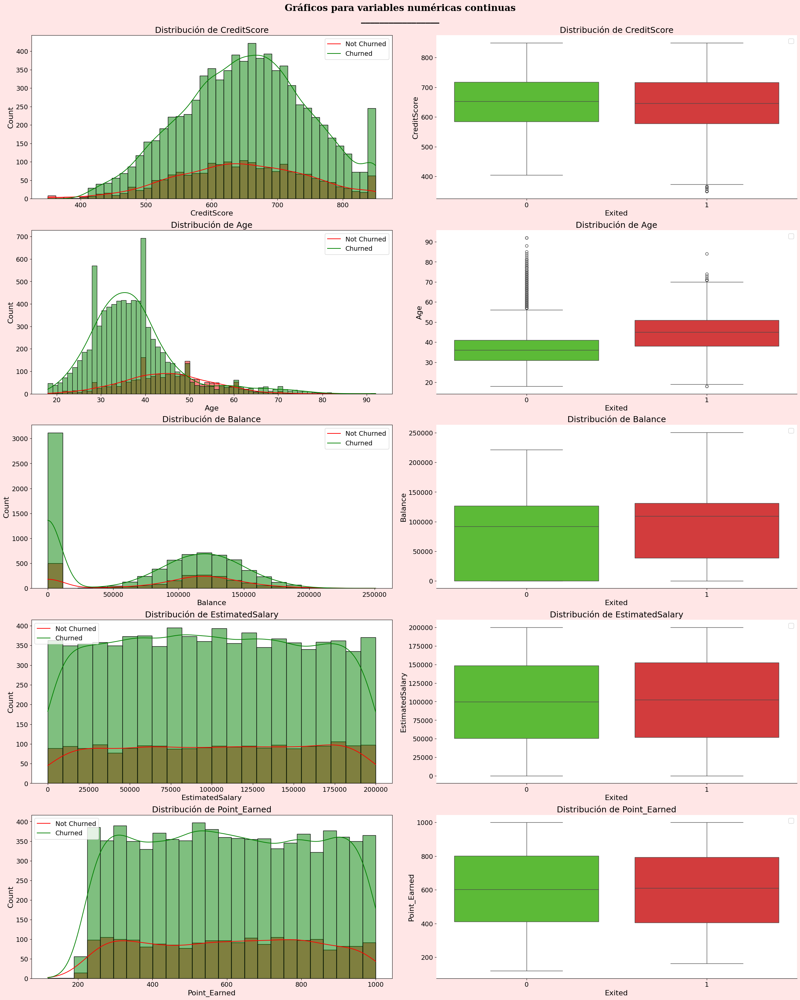

In [19]:
# Definir una paleta de colores personalizada
custom_palette = ["#800000", "#8000ff", "#6aac90", "#5833ff", "#da8829"]
bar_palette = {0: 'green', 1: 'red'}
colors = ["#53D021", "#EB2325"]

# Configurar la figura con constrained_layout
fig, axes = plt.subplots(len(numerical_cont_cols), 2, figsize=(24, len(numerical_cont_cols) * 6), constrained_layout=True)  # Aumentar la altura de la figura
fig.patch.set_facecolor("#ffe6e6")

# Título del gráfico
fig.suptitle('Gráficos para variables numéricas continuas\n_________________', 
             fontsize=20, fontweight='bold', fontfamily='serif', color="#000000") 

# Crear gráficos de histograma con KDE y de caja para cada columna numérica continua
for i, col in enumerate(numerical_cont_cols):
    # Histograma con KDE
    hist_ax = axes[i, 0]
    sns.histplot(ax=hist_ax, x=col, hue='Exited', data=df, kde=True, palette=bar_palette)
    hist_ax.set_xlabel(col, fontsize=16)  
    hist_ax.set_ylabel('Count', fontsize=16)  
    hist_ax.set_title(f'Distribución de {col}', fontsize=18) 
    hist_ax.legend(['Not Churned', 'Churned'], fontsize=14)  
    hist_ax.tick_params(axis='both', which='major', labelsize=14) 

    # Gráfico de caja
    box_ax = axes[i, 1]
    sns.boxplot(ax=box_ax, x='Exited', y=col, hue='Exited', data=df, palette=colors)
    box_ax.set_title(f'Distribución de {col}', fontsize=18) 
    box_ax.set_xlabel('Exited', fontsize=16)  
    box_ax.set_ylabel(col, fontsize=16)  
    box_ax.legend([], fontsize=14)  
    box_ax.tick_params(axis='both', which='major', labelsize=14) 
    for s in ["top", "right", "left"]:
        box_ax.spines[s].set_visible(False)

plt.show()

<Figure size 2000x2000 with 0 Axes>

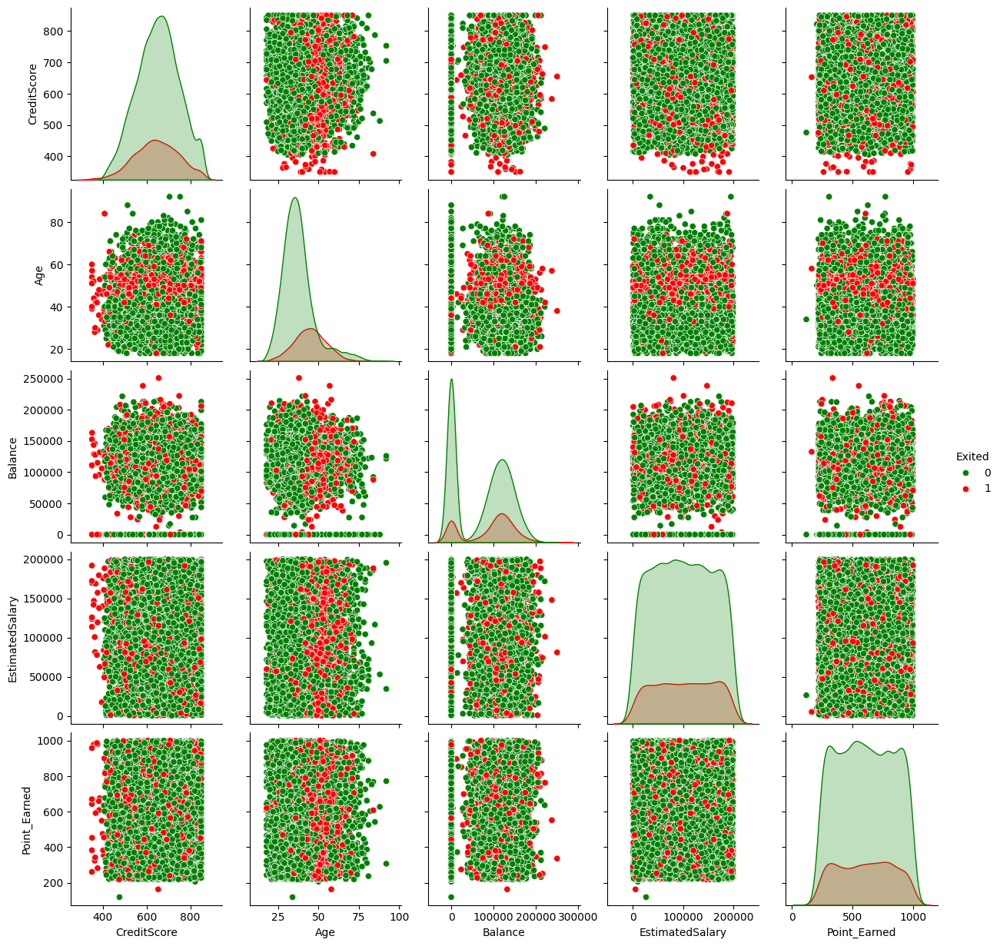

In [21]:
# Definir una paleta de colores personalizada
palette = {0: 'green', 1: 'red'}

# Configurar la figura
fig = plt.figure(figsize=(20, 20))
background_color = "#ffe6e6"
fig.patch.set_facecolor(background_color)

# Añadir 'Exited' a la lista de columnas pues no está incluida
if 'Exited' not in numerical_cont_cols:
    numerical_cont_cols.append('Exited')

# Crear el pairplot
pairplot = sns.pairplot(df[numerical_cont_cols], hue='Exited', palette=palette)

# Configurar el fondo de los ejes del pairplot
for ax in pairplot.axes.flatten():
    ax.set_facecolor('white')  # Fondo blanco para cada gráfico

# Fondo general
fig.patch.set_facecolor(background_color)

# Mostrar el gráfico
numerical_cont_cols.remove('Exited')
plt.show()

### 2.3.3 Identificación de valores atípicos y definición de estrategias con ellos

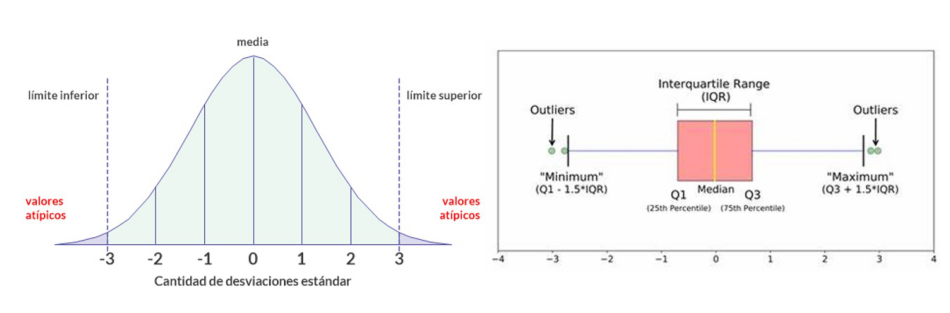

In [54]:
mostrar_imagen('c:/Phyton/CorrecionAtipicos.jpg')

Vamos a analizar la presencia de atípicos en las variables numéricas continuas , para lo que emplearemos dos metodos: IQR y +- 3 desv. tipicas

---- Outliers en variables númericas continuas ----

['CreditScore', 'Age', 'Balance', 'EstimatedSalary', 'Point_Earned']



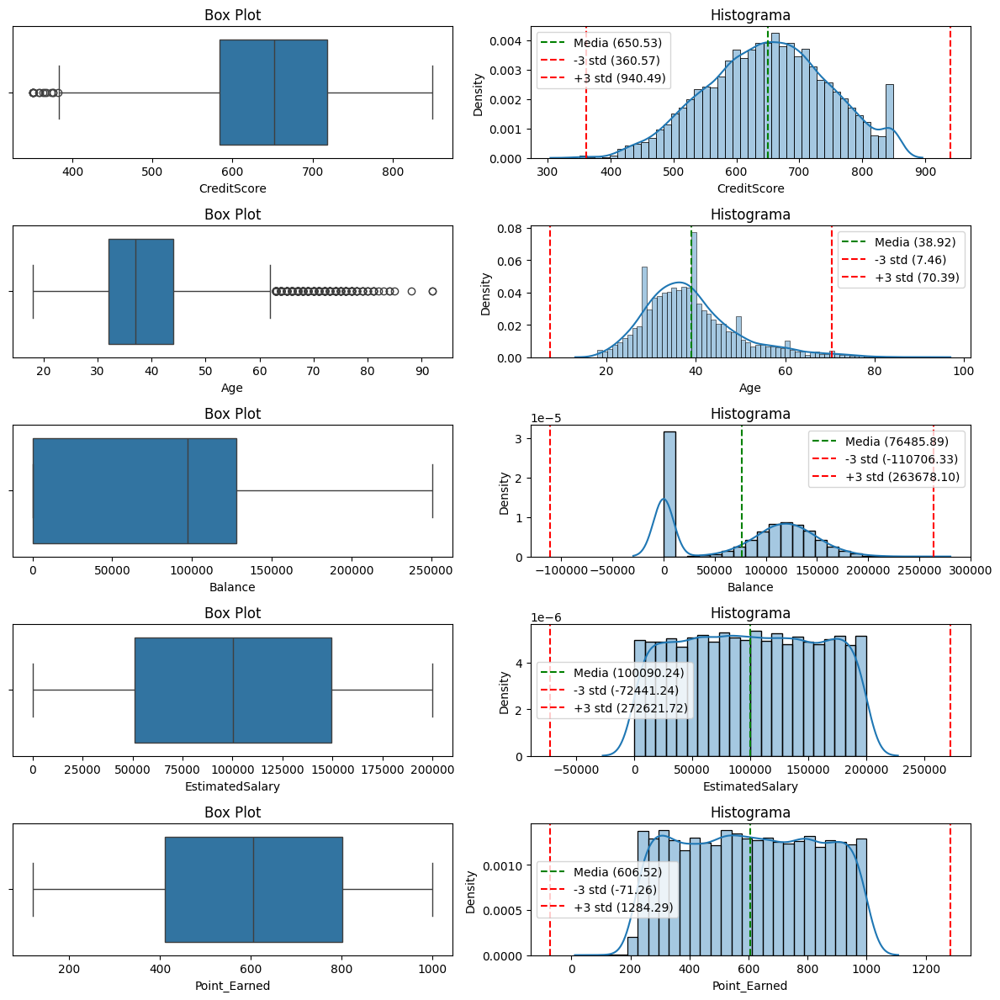

In [22]:
# Análisis de outliers

print("---- Outliers en variables númericas continuas ----")
print("")
print(numerical_cont_cols)
print("")

fig, axes = plt.subplots(len(numerical_cont_cols), 2, figsize=(12, 12))

for i, col in enumerate(numerical_cont_cols):
    sns.boxplot(ax=axes[i, 0], x=df_numerical_cont_cols[col])
    axes[i, 0].set_title(f'Box Plot', fontsize=12)
    
    sns.histplot(ax=axes[i, 1], x=df_numerical_cont_cols[col], kde=True, stat="density", kde_kws={'cut': 3}, alpha=.4)
    axes[i, 1].set_title(f'Histograma', fontsize=12)
    
    media = df_numerical_cont_cols[col].mean()
    std = df_numerical_cont_cols[col].std()
    axes[i, 1].axvline(x=media, color='green', linestyle='--', label=f'Media ({media:.2f})')
    axes[i, 1].axvline(x=media - 3 * std, color='red', linestyle='--', label=f'-3 std ({media-3*std:.2f})')
    axes[i, 1].axvline(x=media + 3 * std, color='red', linestyle='--', label=f'+3 std ({media+3*std:.2f})')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()

In [25]:
# Definir el umbral para los valores atípicos (por ejemplo, 3 desviaciones estándar)
umbral = 3

outliers_data = {}

# Identificamos el número de outliers en cada variable
outliers_count_iqr = {}
outliers_count_std = {}

# Calculamos el número de outliers utilizando IQR
for col in numerical_cont_cols:
    
    media = df[col].mean()
    desviacion_estandar = df[col].std()
    
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers_count_iqr[col] = {
        "lower outliers iqr": df[df[col] < lower_bound].shape[0],
        "upper outliers iqr": df[df[col] > upper_bound].shape[0]
    }

    outliers_count_std[col] = {
        "lower outliers std": df[df[col] < media - umbral * desviacion_estandar].shape[0],
        "upper outliers std": df[df[col] > media + umbral * desviacion_estandar].shape[0]
    }

In [27]:
# Conteo outliers por IQR
outliers_count_iqr=pd.DataFrame(outliers_count_iqr)

# Conteo outliers por +-3 std
outliers_count_std=pd.DataFrame(outliers_count_std)

pd.concat([outliers_count_std,outliers_count_iqr], axis=0)

,CreditScore,Age,Balance,EstimatedSalary,Point_Earned
lower outliers std,8,0,0,0,0
upper outliers std,0,133,0,0,0
lower outliers iqr,15,0,0,0,0
upper outliers iqr,0,359,0,0,0


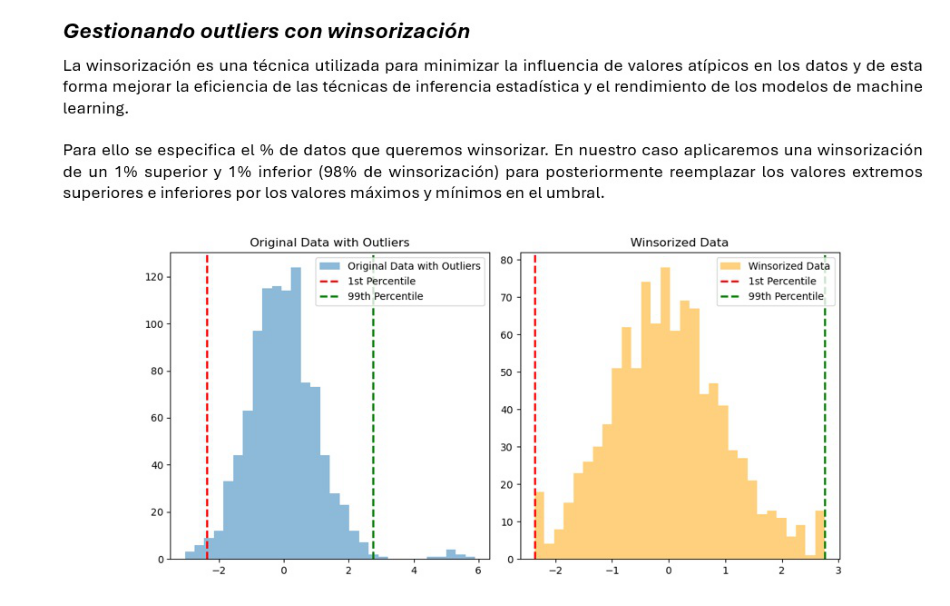

In [98]:
mostrar_imagen('c:/Phyton/Winsorizacion.jpg')

Columnas con outliers corregidos: ['CreditScore', 'Age']


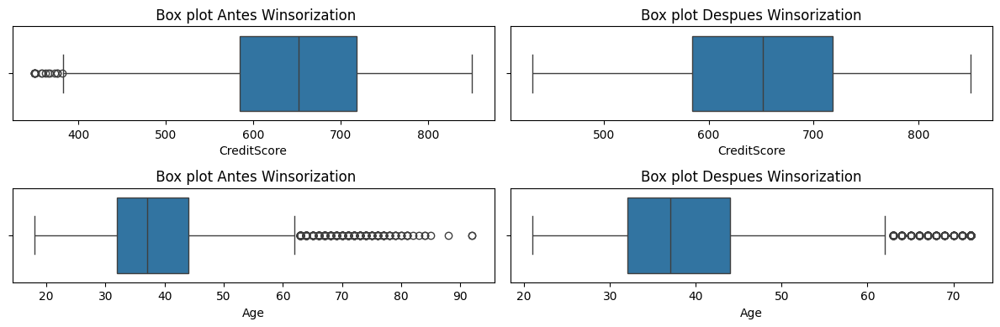

In [29]:
# Gestionando outliers con winsorización

# Seleccionamos aquellas columnas con outliers
outliers_count_std_sel=outliers_count_std.loc[:, outliers_count_std.sum() > 0]
outliers_count_std_sel
outliers_corregir = outliers_count_std_sel.columns.tolist()

print("Columnas con outliers corregidos:", outliers_corregir)

# Aplicamos la winsorización para tratar los outliers

for col in outliers_corregir:
    df[col] = mstats.winsorize(df[col], limits=[0.01, 0.01])

if len(outliers_corregir) == 1:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes = [axes]  # Convertir a lista para mantener la consistencia
else:
    fig, axes = plt.subplots(len(outliers_corregir), 2, figsize=(12, 4))

for i, col in enumerate(outliers_corregir):
    # Boxplot antes de la winsorización
    sns.boxplot(ax=axes[i][0], x=df_numerical_cont_cols[col])
    axes[i][0].set_title(f' Box plot Antes Winsorization', fontsize=12)

    # Boxplot después de la winsorización
    sns.boxplot(ax=axes[i][1], x=df[col])
    axes[i][1].set_title(f'Box plot Despues Winsorization', fontsize=12)

plt.tight_layout()
plt.show()

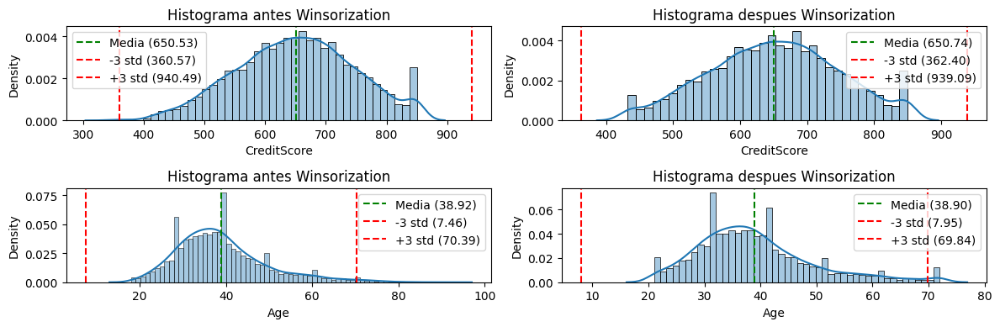

In [31]:
if len(outliers_corregir) == 1:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes = [axes]  # Convertir a lista para mantener la consistencia
else:
    fig, axes = plt.subplots(len(outliers_corregir), 2, figsize=(12, 4))

for i, col in enumerate(outliers_corregir):
    # Histograma antes de la winsorización
    sns.histplot(ax=axes[i, 0], x=df_numerical_cont_cols[col], kde=True, stat="density", kde_kws={'cut': 3}, alpha=.4)
    axes[i, 0].set_title(f'Histograma antes Winsorization', fontsize=12)
    
    media = df_numerical_cont_cols[col].mean()
    std = df_numerical_cont_cols[col].std()
    axes[i, 0].axvline(x=media, color='green', linestyle='--', label=f'Media ({media:.2f})')
    axes[i, 0].axvline(x=media - 3 * std, color='red', linestyle='--', label=f'-3 std ({media-3*std:.2f})')
    axes[i, 0].axvline(x=media + 3 * std, color='red', linestyle='--', label=f'+3 std ({media+3*std:.2f})')
    axes[i, 0].legend()

    # Histograma despues de la winsorización
    sns.histplot(ax=axes[i, 1], x=df[col], kde=True, stat="density", kde_kws={'cut': 3}, alpha=.4)
    axes[i, 1].set_title(f'Histograma despues Winsorization', fontsize=12)
    
    media = df[col].mean()
    std = df[col].std()
    axes[i, 1].axvline(x=media, color='green', linestyle='--', label=f'Media ({media:.2f})')
    axes[i, 1].axvline(x=media - 3 * std, color='red', linestyle='--', label=f'-3 std ({media-3*std:.2f})')
    axes[i, 1].axvline(x=media + 3 * std, color='red', linestyle='--', label=f'+3 std ({media+3*std:.2f})')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()

### 2.3.4 Data Transforms: Cambiando la escala o distribución de las variables

El **feature scaling** (escalado de características) es una técnica de preprocesamiento de datos utilizada en machine learning para estandarizar las características (features) de un conjunto de datos. Esto es importante porque muchas veces las características tienen diferentes escalas y rangos, lo que puede afectar negativamente el rendimiento de algunos algoritmos de aprendizaje automático.

**¿Por qué es importante el Feature Scaling?**

- **Mejora el rendimiento del modelo:** Algoritmos como la regresión logística, SVM y KNN se ven afectados por la escala de las características. El escalado garantiza que todas las características contribuyan de manera equitativa al modelo.

- **Convergencia más rápida**: En algoritmos basados en gradiente descendente, como la regresión lineal y las redes neuronales, el escalado de características puede acelerar la convergencia.

- **Prevención de inestabilidad numérica:** Diferencias significativas en la escala de las características pueden causar problemas de inestabilidad numérica en cálculos como la distancia euclidiana.

**Métodos Comunes de Feature Scaling**

- **Normalización (Min-Max Scaling):** Escala las características para que estén en un rango específico, generalmente [0, 1].

- **Estandarización (Z-score Normalization):** Transforma las características para que tengan una media de 0 y una desviación estándar de 1.

- **Escalado por Máximo Absoluto:** Escala las características dividiendo por el valor absoluto máximo de cada característica. Útil cuando los datos contienen valores atípicos.


En nuestro caso aplicaremos, previo al entrenamiento de los distintos modelos que vamos a implementar, un escalado de las características aplicando la técnica **StandardScaler.**

**StandardScaler** es una técnica de preprocesamiento en el ámbito del aprendizaje automático que se utiliza para estandarizar las características de un conjunto de datos eliminando la media y escalando los datos para que tengan una varianza unitaria. Esto significa que transforma los datos de manera que su distribución tenga una media de cero y una desviación estándar de uno. 

Este proceso de estandarización es importante porque muchos algoritmos de aprendizaje automático funcionan mejor cuando las características se distribuyen normalmente, es decir, en forma de campana de Gauss con media cero y varianza unitaria.


**Transformación de variables categóricas:**

Para transformar las variables categóricas presentes en el dataframe usaremos las técnicas One-hot encoding y LabelEncoder, 
utilizadas en el procesamiento de datos para convertir valores categóricos en valores numéricos que los modelos de aprendizaje automático puedan entender mejor.

**One-hot encoding** es un proceso que convierte variables categóricas en una forma que se puede proporcionar a los algoritmos de ML para hacer un mejor trabajo en la predicción. Para cada valor único en una columna categórica, se crea una nueva columna binaria (0 o 1). Por otro lado, **LabelEncoder** asigna a cada valor único en la columna un número entero. Es más simple que One-hot encoding y se usa a menudo cuando la variable categórica es ordinal, lo que significa que hay un orden claro entre las categorías. Por ejemplo, si tenemos tamaños como “pequeño”, “mediano” y “grande”, LabelEncoder podría asignar 0 a “pequeño”, 1 a “mediano” y 2 a "grande"2.Ambos métodos son parte de la biblioteca de Python SciKit-learn, que es ampliamente utilizada en ciencia de datos y aprendizaje automático para preparar datos antes de entrenar modelos.



### 2.4 Feature Selection: Identificación de las variables más relevantes

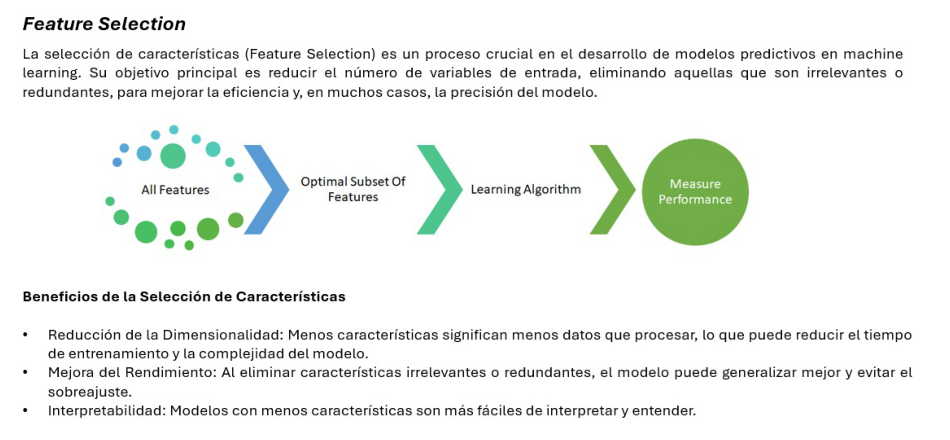

In [67]:
mostrar_imagen('c:/Phyton/FeatureSelection.jpg')

### 2.4.1 Filter Methods

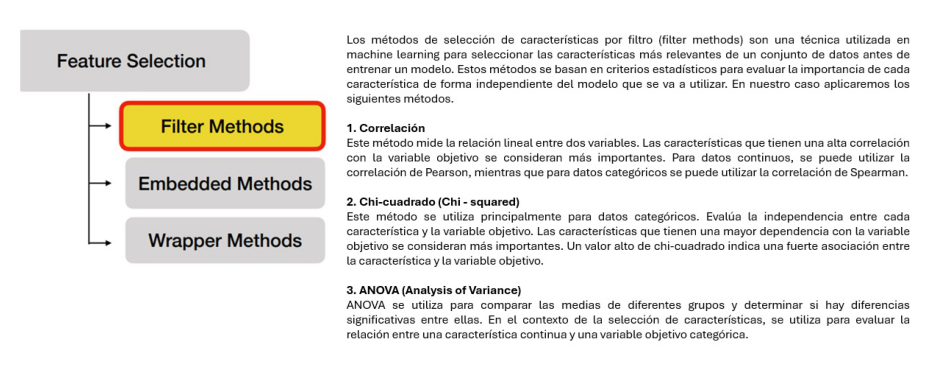

In [69]:
mostrar_imagen('c:/Phyton/FilterMethods.jpg')

#### 2.4.1 Filter Methods: Correlación, Chi-cuadrado y Anova

In [33]:
# Variables binarias y categoricas
y = df['Exited']
df2=pd.concat([df_binary_cols,df_categorical_cols,y], axis=1)

# Codificación de variables categoricas
label_encoder = LabelEncoder()
df2['Gender'] = label_encoder.fit_transform(df2['Gender'])

# Codificación Card_Type y Geografhy para prueba chi2
df2['Card_Type'] = label_encoder.fit_transform(df2['Card_Type'])
df2['Geography'] = label_encoder.fit_transform(df2['Geography'])

X = df2.drop(['Exited'], axis=1)
y = df2['Exited']

# Calcular la prueba de chi-cuadrado
chi2_stats, p_values = chi2(X, y)

# Calcular la correlación con la variable 'Exited'
correlation_with_exited = (df2.corr()['Exited'].drop('Exited') * 100).round(2)

# Interpretar los resultados

alpha = 0.05

# Crear un DataFrame con los resultados para cada variable
results_df2 = pd.DataFrame({
    'Variable': X.columns,
    'chi-cuadrado': chi2_stats.round(3),
    'Valor p': p_values.round(3),
    'Sign si < alpha': p_values < alpha,
    'Correlación (%)': correlation_with_exited.values
})

print('Prueba de Chi-cuadrado y correlación')
print('---')
print(f"alpha: {alpha}")
print('---')
print(results_df2)

Prueba de Chi-cuadrado y correlación
---
alpha: 0.05
---
         Variable  chi-cuadrado  Valor p  Sign si < alpha  Correlación (%)
0       HasCrCard         0.143    0.705            False            -0.70
1  IsActiveMember       118.544    0.000             True           -15.64
2        Complain      7887.607    0.000             True            99.57
3       Geography        11.702    0.001             True             3.57
4          Gender        51.302    0.000             True           -10.63
5       Card_Type         0.985    0.321            False            -1.09


**HasCrCard** y **Card_Type** muestran muy poca dependencia y correlación con la variable Objetivo Exit.
**Complain** muestra una correlación lineal casi perfecta y debe por tanto ser descartada a la hora de construir un modelo de ML.

In [35]:
# Eliminamos Complain por casi perfecta correlación
df=df.drop(columns = ['Complain'],axis=1)

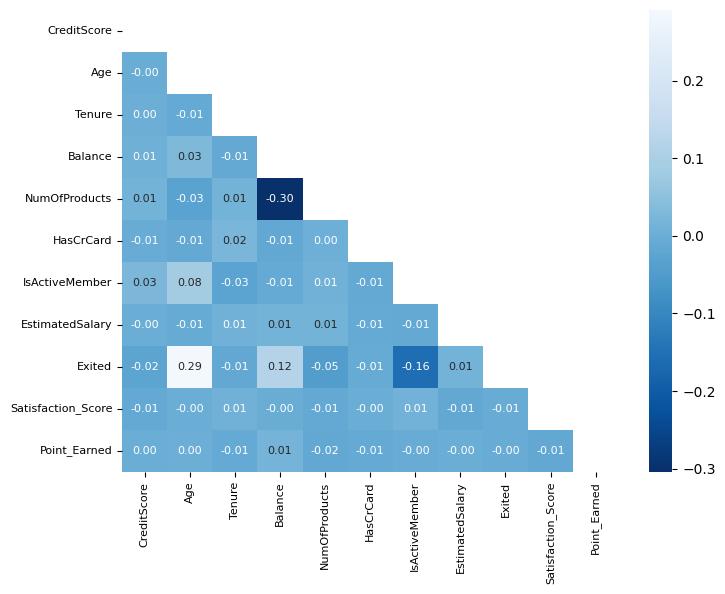

Correlation with Exited : 
Age                   0.29
Balance               0.12
EstimatedSalary       0.01
Point_Earned         -0.00
Tenure               -0.01
HasCrCard            -0.01
Satisfaction_Score   -0.01
CreditScore          -0.02
NumOfProducts        -0.05
IsActiveMember       -0.16
Name: Exited, dtype: float64

Variables con significación >= 0.05 con Exited: 
Age               0.29
Balance           0.12
NumOfProducts    -0.05
IsActiveMember   -0.16
Name: Exited, dtype: float64


In [37]:
# Variables numericas

# Usaremos una correlation matrix heatmap para visualizar las correlaciones entre las variables numericas
# Podemos visualizar las correlaciones entre variables utilizando una matriz de correlación (heatmap)
# Calcular la matriz de correlación
corr = df.select_dtypes(include=['int', 'float']).corr()

# Crear una máscara para la mitad superior
mask = np.triu(np.ones_like(corr, dtype=bool))

# Configurar la figura
plt.figure(figsize=(8, 6))

# Crear el heatmap con la máscara
sns.heatmap(corr, mask=mask, annot=True, center=0, cmap='Blues_r', fmt='.2f', annot_kws={'size': 8})

# Ajustar el tamaño de las etiquetas
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.show()

# Ｃorrelation with Ｅxited
correlation_with_exited = (df.select_dtypes(include=['int', 'float']).corr()['Exited']).round(2)
# Excluir Exited
correlation_with_exited = correlation_with_exited[correlation_with_exited.index != 'Exited']
sorted_correlation = correlation_with_exited.sort_values(ascending=False)
print(f'Correlation with Exited : \n{sorted_correlation}')

# Seleccionar solo las que tengan valores >= 0.05
selected_variables = sorted_correlation[(sorted_correlation >= 0.05) | (sorted_correlation <= -0.05)]
print()
print(f'Variables con significación >= 0.05 con Exited: \n{selected_variables}')

In [39]:
# Mostrar variables que tengan alta correlación entre ellas

print()
print(f'Pares de Variables con significación >= 0.10 o <= -0.10: \n')

# Calcular la matriz de correlación
corr_matrix = df.select_dtypes(include=['int', 'float']).drop(columns=['Exited']).corr().round(2)

# Filtrar los pares de valores con correlación > 0.1 o < -0.1
threshold = 0.1
filtered_pairs = corr_matrix[(corr_matrix > threshold) | (corr_matrix < -threshold)]

# Convertir la matriz filtrada a un formato de pares
pairs = filtered_pairs.stack().reset_index()
pairs.columns = ['Variable1', 'Variable2', 'Correlation']

# Eliminar los pares duplicados y los pares de la diagonal (correlación de una variable consigo misma)
pairs = pairs[pairs['Variable1'] != pairs['Variable2']]
pairs = pairs.drop_duplicates(subset=['Correlation'])

# Mostrar los resultados
print(pairs)



Pares de Variables con significación >= 0.10 o <= -0.10: 

  Variable1      Variable2  Correlation
4   Balance  NumOfProducts         -0.3


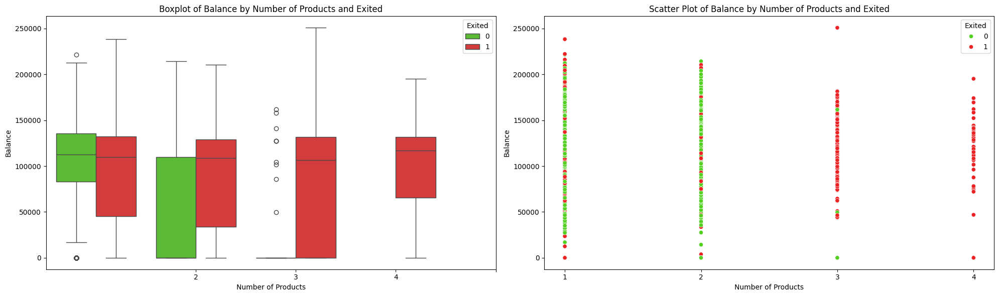

In [41]:
# Analizamos Balance y NumOfProducts

# Definir los colores
colors = ["#53D021", "#EB2325"]

# Crear subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

# Crear el boxplot
sns.boxplot(ax=axes[0], x='NumOfProducts', y='Balance', hue='Exited', data=df, palette=colors)
axes[0].set_title('Boxplot of Balance by Number of Products and Exited')
axes[0].set_xlabel('Number of Products')
axes[0].set_ylabel('Balance')
axes[0].set_xticks(df['NumOfProducts'].unique())  # Asegurar que las etiquetas del eje x sean discretas

# Crear el gráfico de dispersión
sns.scatterplot(ax=axes[1], x='NumOfProducts', y='Balance', hue='Exited', data=df, palette=colors)
axes[1].set_title('Scatter Plot of Balance by Number of Products and Exited')
axes[1].set_xlabel('Number of Products')
axes[1].set_ylabel('Balance')
axes[1].set_xticks(df['NumOfProducts'].unique())  # Asegurar que las etiquetas del eje x sean discretas

# Ajustar el diseño
plt.tight_layout()
plt.show()

#### 2.4.2 Filter Methods empleando el metodo K-best

**Implementación en Python de los métodos de selección de características por filtro (filter methods) con SelectKbest**

**SelectKBest** es una clase en la librería scikit-learn que implementa un método de selección de características. No es un algoritmo en sí mismo, sino una herramienta que te permite aplicar los diferentes criterios (algoritmos) de selección de características.

- La clase SelectKBest selecciona las mejores características basándose en una función de puntuación que tú eliges. Por ejemplo, puedes usar chi2 para el test de chi-cuadrado, f_classif para ANOVA, mutual_info_classif para información mutua. Estos son los algoritmos que realmente calculan la relevancia de cada característica.

**Cuando usar chi2:**

La función chi2 es adecuada para características no negativas y se utiliza principalmente en tareas de clasificación con variables categóricas. SelectKBest con la función chi2 se puede usar con variables numéricas, pero requiere que las variables numéricas sean no negativas. Si tienes valores negativos, necesitarás discretizarlas (convertirlas en categorías) antes de aplicar chi2.

**ANOVA F -value (f_classif):**

- Mide la relación lineal entre las características y la variable objetivo.

- Para aplicarlo las variables independientes (características) deben ser numéricas pues se evalúa la varianza entre las medias de estas características para diferentes clases, y la variable Dependiente (objetivo) debe ser categórica, pues El ANOVA F-value se utiliza para determinar si las medias de las características numéricas son significativamente diferentes entre las distintas categorías de la variable objetivo.



Para seleccionar las variables más significativas con el metodo K-best usaremos Chi-cuadrado (sin discretización
y con discretización de las variables númericas) y f_classif para realizar una prueba de ANOVA.

In [43]:
# Primero codificamos las variables categoricas 

#Codificación One-hot para las variables 'Geography' y 'Card Type'
df= pd.get_dummies(df, columns=['Geography', 'Card_Type'], drop_first=True)

# Codificación de etiquetas para la variable 'Gender'
label_encoder = LabelEncoder()
df['Gender'] = label_encoder.fit_transform(df['Gender'])

In [279]:
X = df.drop(['Exited'], axis=1)
y = df['Exited']
# Discretizar las variables numéricas para chi-cuadrado
discretizer = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='uniform')
X_discretized = discretizer.fit_transform(X)

# Crear selectores de características
selectors = {
    'chi2': SelectKBest(score_func=mutual_info_classif, k=10),
    'chi2 discretizado': SelectKBest(score_func=chi2, k=10),
    'f_classif': SelectKBest(score_func=f_classif, k=10),
}

# DataFrame para almacenar los resultados
results = pd.DataFrame(0, index=selectors.keys(), columns=X.columns)

# Aplicar cada selector y almacenar los resultados
for method, selector in selectors.items():
    if method == 'chi2 discretizado':
        X_new = selector.fit_transform(X_discretized, y)
    else:
        X_new = selector.fit_transform(X, y)
    
    selected_features = selector.get_support(indices=True)
    results.loc[method, [X.columns[i] for i in selected_features]] = 1

#Transponer el DataFrame 'results'
results_transposed = results.T

# Añadir una columna de suma con el total
results_transposed['Total'] = results_transposed.sum(axis=1)

# Ordenar el DataFrame en orden descendente por la columna 'Total'
results_Kbest = results_transposed.sort_values(by='Total', ascending=False)
print('Feature Selection: Univariante Feature Selection (SelectKbest) (1:Feature seleccionada , 0: No seleccionada)')
print('--------------------------')
print(results_Kbest)

Feature Selection: Univariante Feature Selection (SelectKbest) (1:Feature seleccionada , 0: No seleccionada)
--------------------------
                    chi2  chi2 discretizado  f_classif  Total
Gender                 1                  1          1      3
Age                    1                  1          1      3
Balance                1                  1          1      3
NumOfProducts          1                  1          1      3
IsActiveMember         1                  1          1      3
Geography_Germany      1                  1          1      3
CreditScore            0                  1          1      2
Tenure                 0                  1          1      2
Geography_Spain        0                  1          1      2
Card_Type_GOLD         0                  1          1      2
HasCrCard              1                  0          0      1
EstimatedSalary        1                  0          0      1
Satisfaction_Score     1                  0          0    

In [45]:
# Seleccionamos las filas donde Total >= 2
filtered_df = results_Kbest[results_Kbest['Total'] >= 2]

# Convertimos el índice de las filas seleccionadas en una lista
Best_results_kbest = filtered_df.index.tolist()

print("Las variables que han sido seleccionadas entre las 10 más significativas por Kbest son:\n")
print(Best_results_kbest)

# Seleccionamos las filas donde Total = 0
filtered_df2 = results_Kbest[results_Kbest['Total'] == 0]

# Convertimos el índice de las filas seleccionadas en una lista
Worst_results_kbest = filtered_df2.index.tolist()

print("----------------------")
print("Las variables que no han sido seleccionadas entre las 10 más significativas por Kbest son:\n")
print(Worst_results_kbest)

NameError: name 'results_Kbest' is not defined

### 2.4.3 Embedded Methods: RandomForest

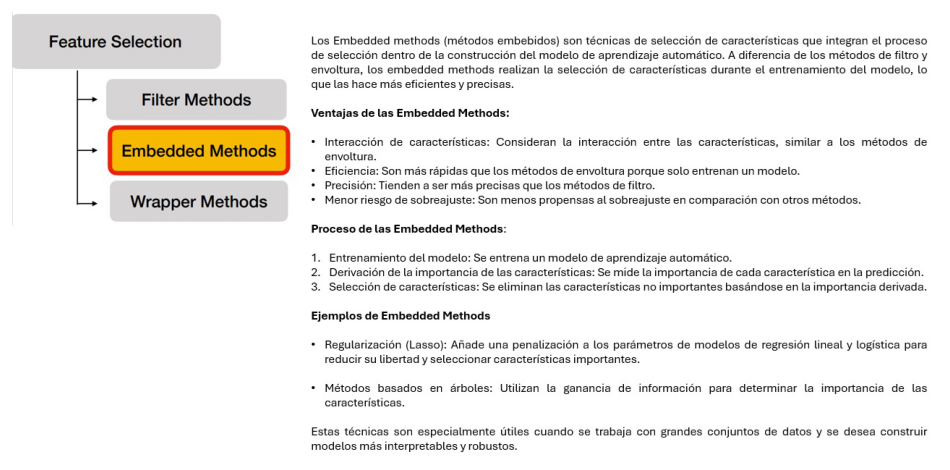

In [89]:
mostrar_imagen('c:/Phyton/Embedded Methods.jpg')

En nuestro caso entrenaremos un modelo RandomForest para seleccionar las 10 mejores caracteristicas de nuestro df

In [47]:
#Añado una variable aleatoria que me va a servir para comparar con otras y ver un posible punto de corte para la significación
np.random.seed(123)
random_values = np.random.rand(df.shape[0])

# Remodelar random_values para que coincida con la forma del DataFrame
x1 = np.abs(np.random.randn(df.shape[0]).reshape(-1, 1))
df['Var']=x1

In [49]:
# función para entrenar el modelo

def entrenar_random_forest(X, umbral):

    #Aplicación RandomOverSampler para correfgir desequilibrio
    # Dividir los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

    # Aplicar RandomOverSampler solo al conjunto de entrenamiento
    rand_over_samp = RandomOverSampler(random_state=42)
    X_train, y_train = rand_over_samp.fit_resample(X_train, y_train)
    X_train.shape,X_test.shape,y_train.shape,y_test.shape

    # Entrenar el modelo de Random Forest
    forest = RandomForestClassifier(max_depth=10, min_samples_split=20, n_estimators=500, random_state=1)
    forest.fit(X_train, y_train)
    
   # Obtener las importancias de las características
    importances = forest.feature_importances_
    
    # Crear una serie de pandas con las importancias
    forest_importances = pd.Series(importances, index=X.columns)
    
    # Seleccionar las características con importancia mayor al umbral
    selected_features = forest_importances[forest_importances > umbral].index.tolist()
    
    # Graficar las importancias de las características
    fig, ax = plt.subplots(figsize=(8, 4))
    background_color = "#ffe6e6"
    fig.patch.set_facecolor(background_color)
    ax.set_facecolor(background_color)
    forest_importances.sort_values().plot.bar(ax=ax, color=sns.color_palette('viridis', len(forest_importances)))
    ax.set_title("Feature importances")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()
    
    # Mostrar las precisiones de entrenamiento y prueba
    
    print('Training accuracy:', np.mean(forest.predict(X_train) == y_train) * 100)
    print('Test accuracy:', np.mean(forest.predict(X_test) == y_test) * 100)
    # Ordenar de mayor a menor
    sorted_importances = sorted(forest_importances.items(), key=lambda item: item[1], reverse=True)

    # Crear un DataFrame a partir de la lista de tuplas ordenadas
    df_importances_forest = pd.DataFrame(sorted_importances, columns=['Feature', 'Importance'])
    print('---------------')
    print(df_importances_forest)
    print('---------------')
    print(f"Las variables que han sido seleccionadas con importancia mayor a {umbral} son:\n")
    df_importances_umbral = df_importances_forest[df_importances_forest['Importance'] >= umbral]
    print(df_importances_umbral)

    return selected_features, forest

Entremo el modelo con todas las variables
Establecer un umbral de corte sobre 0,05 que puede ser ajustado en función de la importancia de la variable aleatoria Var

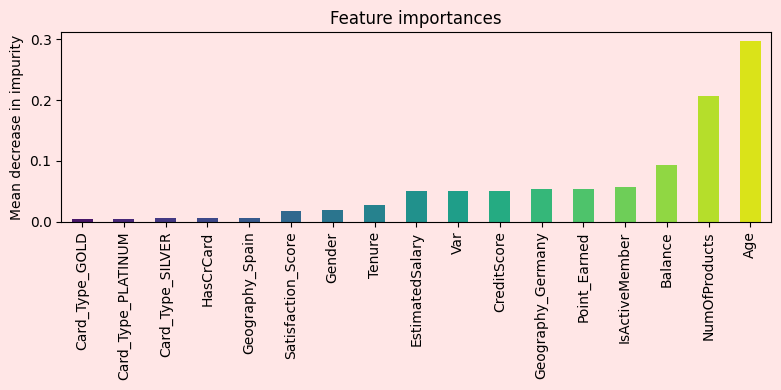

Training accuracy: 89.66875559534468
Test accuracy: 83.0
---------------
               Feature  Importance
0                  Age    0.296463
1        NumOfProducts    0.207190
2              Balance    0.093500
3       IsActiveMember    0.057594
4         Point_Earned    0.053094
5    Geography_Germany    0.053021
6          CreditScore    0.050823
7                  Var    0.049869
8      EstimatedSalary    0.049586
9               Tenure    0.026854
10              Gender    0.019125
11  Satisfaction_Score    0.016767
12     Geography_Spain    0.006090
13           HasCrCard    0.005458
14    Card_Type_SILVER    0.005272
15  Card_Type_PLATINUM    0.004734
16      Card_Type_GOLD    0.004558
---------------
Las variables que han sido seleccionadas con importancia mayor a 0.055 son:

          Feature  Importance
0             Age    0.296463
1   NumOfProducts    0.207190
2         Balance    0.093500
3  IsActiveMember    0.057594


In [51]:
X= df.drop(['Exited'], axis=1)
umbral=0.055
selected_features, forest = entrenar_random_forest(X, umbral)

### 2.4.4 Conclusiones Feature Selection

**Variables muy poco significativas**

- HasCrCard: Denota si un cliente tiene una tarjeta de crédito. Indica si el cliente tiene tarjeta de crédito (1 = Sí, 0 = No).
- Card Type: Indica el tipo de tarjeta que posee el cliente.
- Satisfaction Score: Puntuación proporcionada por el cliente sobre la resolución de su queja.

**Variables más significativas**

- Age: Edad de los clientes.
- Balance: Saldo de los clientes.
- NumOfProducts: Indica el número de productos que un cliente ha adquirido a través del banco. 
- IsActiveMember: Indica si el cliente es un miembro activo (1 = Sí, 0 = No).

**Variables con significación baja**

- Geography: Pais de residencia del cliente.
- Gender: Género del cliente.
- Tenure: Se refiere al número de años que el cliente ha estado con el banco.
- EstimatedSalary: Salario de los clientes.
- Points Earned: Refleja los puntos que el cliente ha ganado al usar su tarjeta de crédito

In [53]:
# Seleccionamos las features que vamos a usar en nuestro entrenamiento, descartando las no significativas
selected_features = ['CreditScore', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'IsActiveMember', 'EstimatedSalary', 'Point_Earned', 'Geography_Germany','Geography_Spain' ]

### 2.5 Reducción de la dimensionalidad de los datos

No se requiere

### 2.6 Feature engineering: Creación de nuevas variables

No se requiere

### 2.7 Guardamos modelo tras EDA

In [55]:
# Eliminamos Var
df=df.drop(columns = ['Var'],axis=1)

# Guardar el DataFrame en un archivo CSV
df.to_csv('c:/Phyton/Customer-Churn-RecordsEDA.csv', index=False)

<span style="font-size:24px; color:red; font-weight:bold">3. Entrenamiento y evaluación de modelos</span>

### 3.1 Elección de algoritmos de machine learning adecuados para el problema.

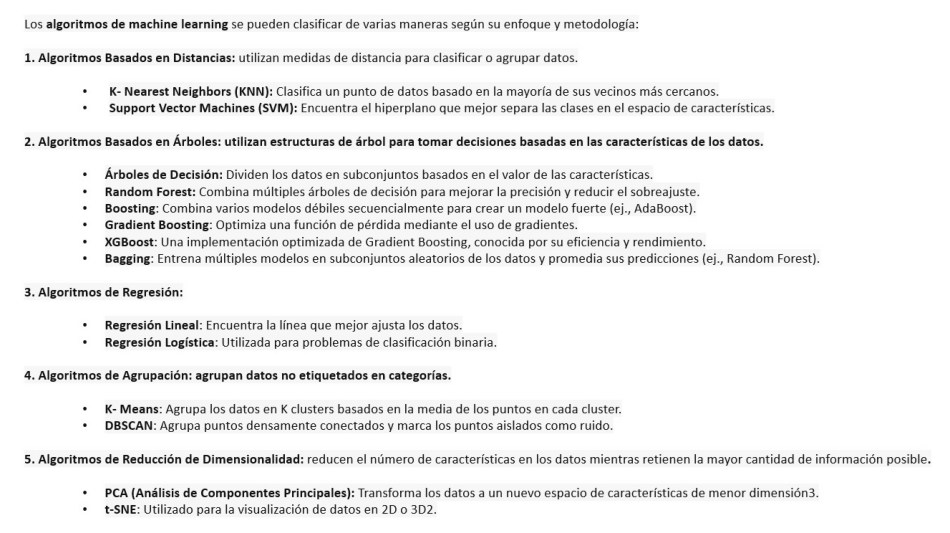

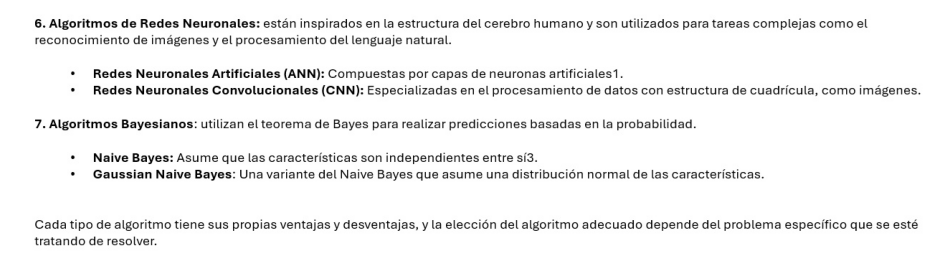

In [109]:
mostrar_imagen('c:/Phyton/AlgoritmosML1.jpg')
mostrar_imagen('c:/Phyton/AlgoritmosML2.jpg')

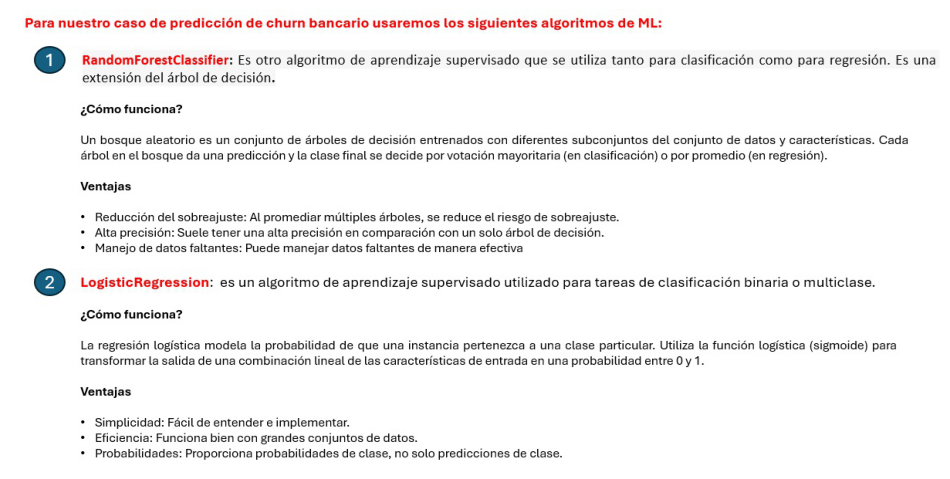

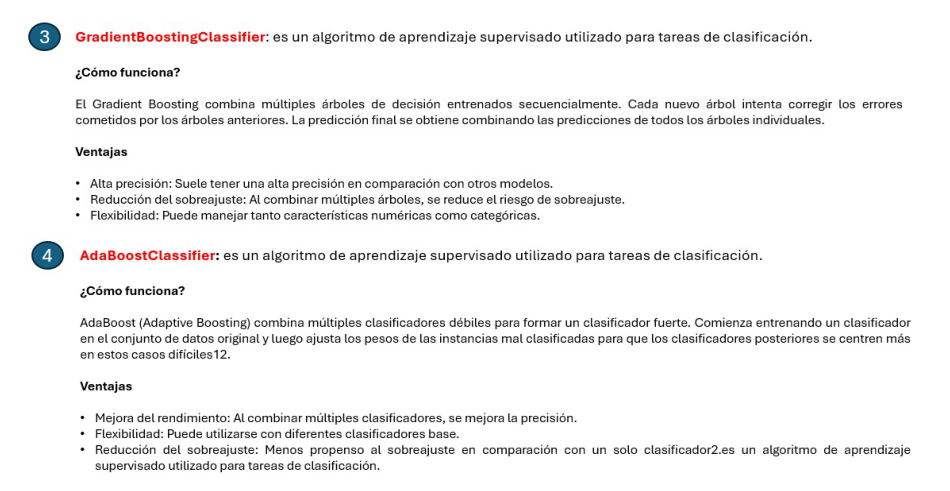

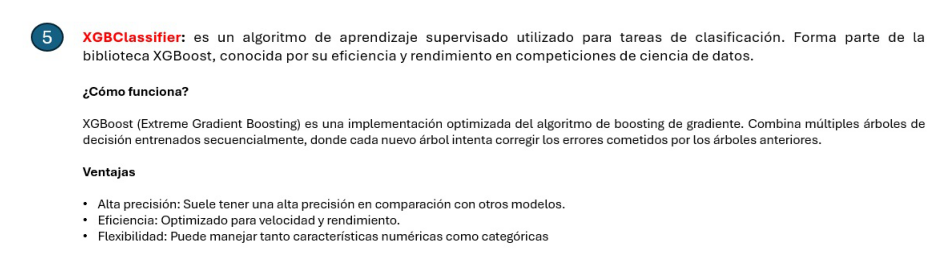

In [111]:
mostrar_imagen('c:/Phyton/ML1.jpg')
mostrar_imagen('c:/Phyton/ML2.jpg')
mostrar_imagen('c:/Phyton/ML3.jpg')

### 3.2 Aplicación de RamdonOverSampler para corregir problema de desequilibrio.

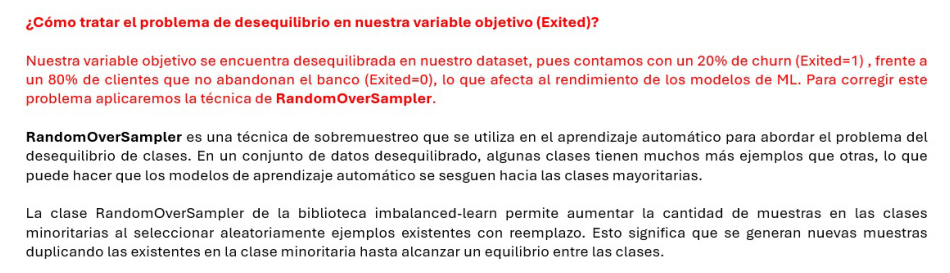

In [113]:
mostrar_imagen('c:/Phyton/RandomOverSampler.jpg')

### 3.3 Entrenamiento de los modelos y evaluación de su rendimiento.

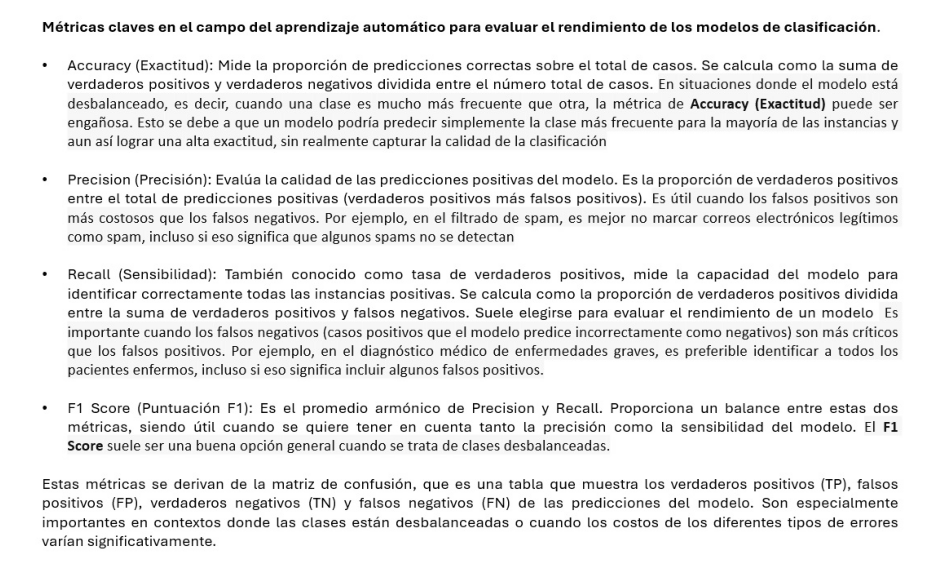

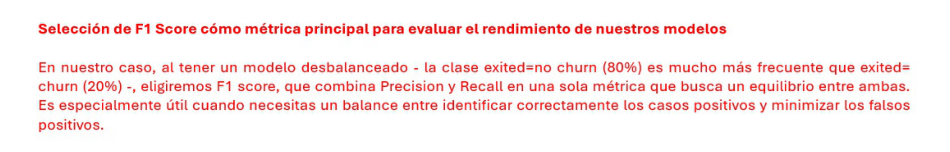

In [115]:
mostrar_imagen('c:/Phyton/Metricas1.jpg')
mostrar_imagen('c:/Phyton/Metricas2.jpg')

In [64]:
# Importamos Dataset ya trabajado con EDA
df=pd.read_csv('c:/Phyton/Customer-Churn-RecordsEDA.csv')
df.head()

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Satisfaction_Score,Point_Earned,Geography_Germany,Geography_Spain,Card_Type_GOLD,Card_Type_PLATINUM,Card_Type_SILVER
0,619,0,42,2,0.00,1,1,1,101348.88,1,2,464,False,False,False,False,False
1,608,0,41,1,83807.86,1,0,1,112542.58,0,3,456,False,True,False,False,False
2,502,0,42,8,159660.80,3,1,0,113931.57,1,3,377,False,False,False,False,False
3,699,0,39,1,0.00,2,0,0,93826.63,0,5,350,False,False,True,False,False
4,850,0,43,2,125510.82,1,1,1,79084.10,0,5,425,False,True,True,False,False


In [68]:
# Seleccionamos las features que vamos a usar en nuestro entrenamiento, descartando las no significativas
selected_features = ['CreditScore', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'IsActiveMember', 'EstimatedSalary', 'Point_Earned', 'Geography_Germany','Geography_Spain' ]

In [70]:
def graficar_precision(pipe, X_train, y_train, X_test, y_test):
    # Predecir en el conjunto de entrenamiento y prueba
    y_train_pred = pipe.predict(X_train)
    y_test_pred = pipe.predict(X_test)
    
    # Calcular la precisión en el conjunto de entrenamiento y prueba
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)

    # Graficar la precisión del entrenamiento vs el test
    plt.figure(figsize=(8, 6))
    plt.bar(['Entrenamiento', 'Test'], [train_accuracy, test_accuracy], color=['blue', 'green'])
    plt.title('Precisión del Entrenamiento vs Test')
    plt.ylabel('Precisión')
    plt.ylim(0, 1)
    plt.show()

In [72]:
# Definimos una función que utilizaremos para ir entrenando el grupo de modelos que hemos elegido

def entrenar_modelos (X):

    df_metricas = pd.DataFrame(columns=['Modelo', 'Sampling','Accuracy', 'Recall','f1_score','Precision'])

    #Definiendo los modelos que vamos a utilizar

    y= df['Exited']
    
    if sampling == "No Sampling":
    
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
    
    else:
        #Aplicación RandomOverSampler para correfgir desequilibrio
        # Dividir los datos en conjuntos de entrenamiento y prueba
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

        # Aplicar RandomOverSampler solo al conjunto de entrenamiento
        rand_over_samp = RandomOverSampler(random_state=42)
        X_train, y_train = rand_over_samp.fit_resample(X_train, y_train)

    scaler = StandardScaler()
    scaled_X_train = scaler.fit_transform(X_train)
    scaled_X_test = scaler.transform(X_test)
    
    modelos = [RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=300, min_samples_leaf=5, random_state=42),
          LogisticRegression(max_iter=5000),
          GradientBoostingClassifier(learning_rate=0.1, max_depth=3, n_estimators=50,random_state=42),
          AdaBoostClassifier(learning_rate= 1.0, n_estimators= 5, random_state=42),
          #RandomForestClassifier(max_depth=10, min_samples_split=10),
          #XGBClassifier(max_depth=10, n_estimators=100, random_state=42)
          XGBClassifier(booster='gbtree', max_depth=None, n_estimators=100, reg_alpha=0.1, learning_rate=0.05, reg_lambda=1.0, eval_metric='logloss', random_state=42)
         ]

    #Impureza de Gini: Este método se utiliza para decidir la división óptima en un árbol de decisión. Funciona especialmente bien con
    #objetivos categóricos y realiza divisiones binarias
    
    # Imprimir los conjuntos de datos
    print("X_train:\n", X_train.shape)
    print("X_test:\n", X_test.shape)
    print("y_train:\n", y_train.shape)
    print("y_test:\n", y_test.shape) 
    
    num=0
    for modelo in modelos:
        print("-"*50)
        print(f'Modelo: {type(modelo).__name__}')

        pipe = Pipeline([('modelo', modelo)])
    
        #Train the model
        pipe.fit(X_train, y_train)

        # Obtener las predicciones para nuevos datos, usando los datos de prueba
        y_pred = pipe.predict(X_test)

        # Evaluar el modelo
        evaluationModel(y_test, y_pred)

        # Calcular las métricas de evaluación
        accuracy = round(accuracy_score(y_test, y_pred), 3)
        recall = round(recall_score(y_test, y_pred), 3)
        f1 = round(f1_score(y_test, y_pred), 3)
        precision = round(precision_score(y_test, y_pred, zero_division=1), 3)

        print("Accuracy:", accuracy)
        print("Recall:", recall)
        print("f1_score:", f1)
        print("Precision:", precision)

        print("y_train:\n", y_train.shape)
        print("y_test:\n", y_test.shape) 

        # Graficar la precisión del entrenamiento vs el test
        graficar_precision(pipe, X_train, y_train, X_test, y_test)

        df_metricas.loc[num] = [type(modelo).__name__, sampling, accuracy, recall,
                            f1,precision]

        
        num = num +1

    return df_metricas

Variables que vamos a utilizar para predecir el churn

In [125]:
selected_features

['CreditScore',
 'Gender',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'IsActiveMember',
 'EstimatedSalary',
 'Point_Earned',
 'Geography_Germany',
 'Geography_Spain']

**Metodo 1:** Pruebo con las variables seleccionadas sin aplicar over sampling 

X_train:
 (7000, 11)
X_test:
 (3000, 11)
y_train:
 (7000,)
y_test:
 (3000,)
--------------------------------------------------
Modelo: RandomForestClassifier


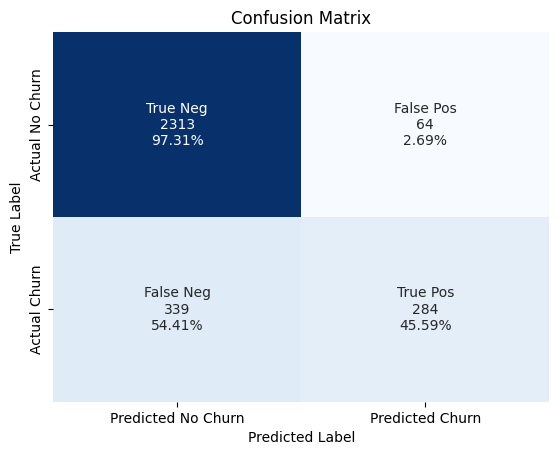

Accuracy: 0.866
Recall: 0.456
f1_score: 0.585
Precision: 0.816
y_train:
 (7000,)
y_test:
 (3000,)


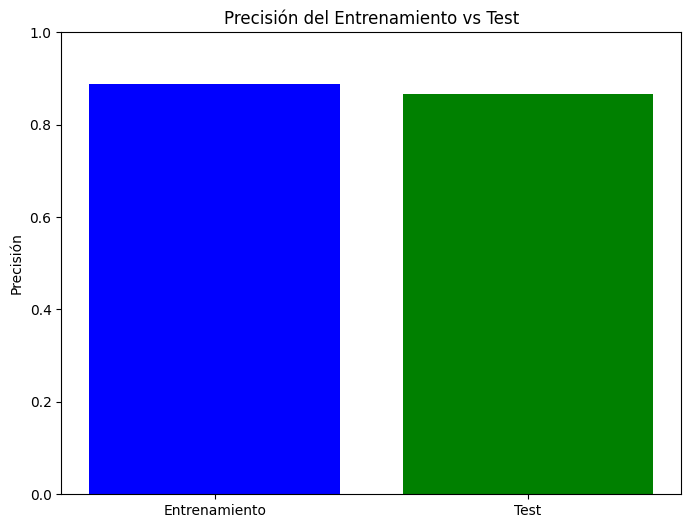

--------------------------------------------------
Modelo: LogisticRegression


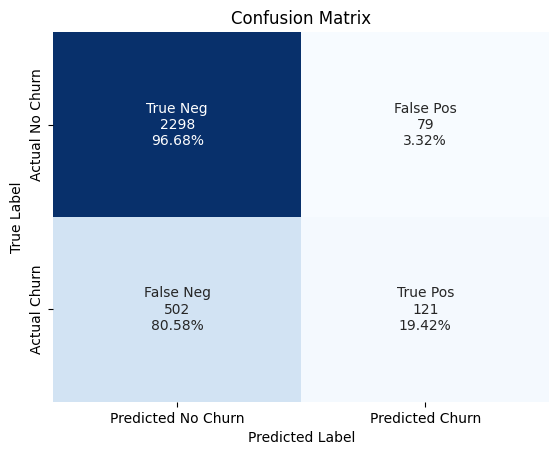

Accuracy: 0.806
Recall: 0.194
f1_score: 0.294
Precision: 0.605
y_train:
 (7000,)
y_test:
 (3000,)


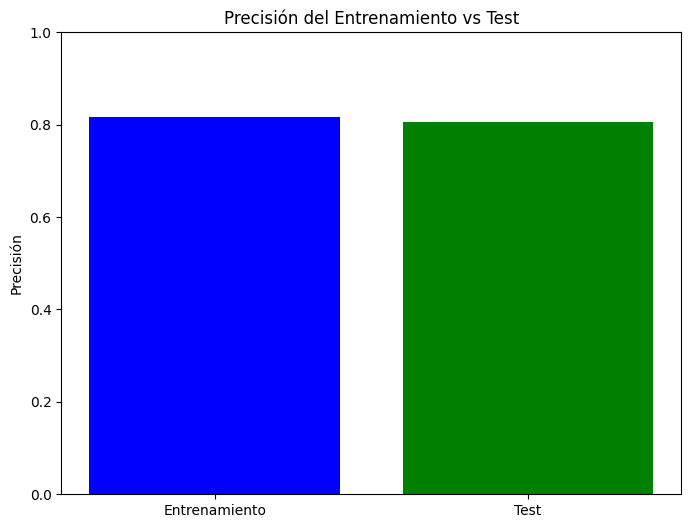

--------------------------------------------------
Modelo: GradientBoostingClassifier


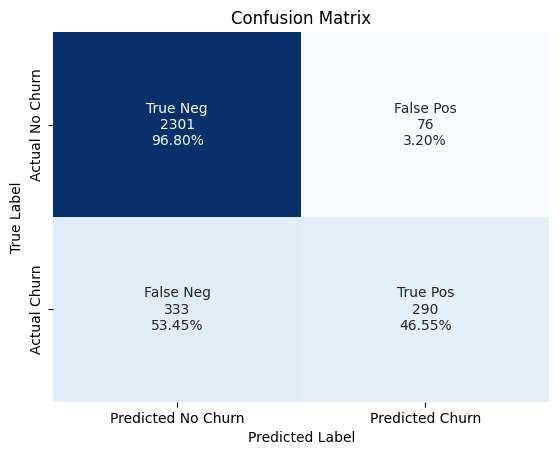

Accuracy: 0.864
Recall: 0.465
f1_score: 0.586
Precision: 0.792
y_train:
 (7000,)
y_test:
 (3000,)


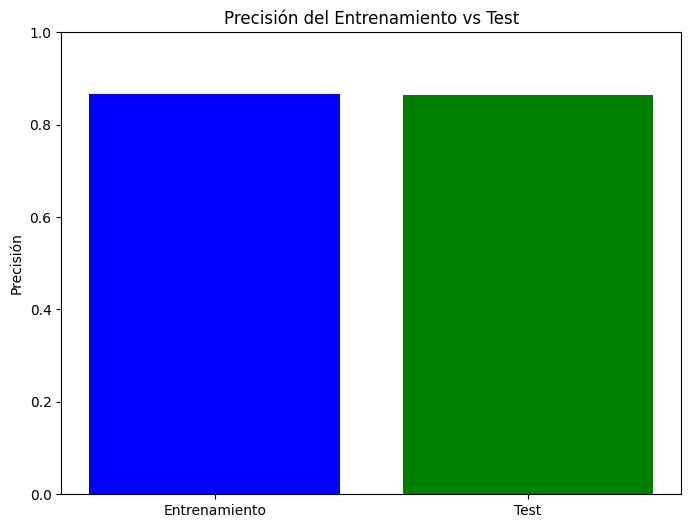

--------------------------------------------------
Modelo: AdaBoostClassifier


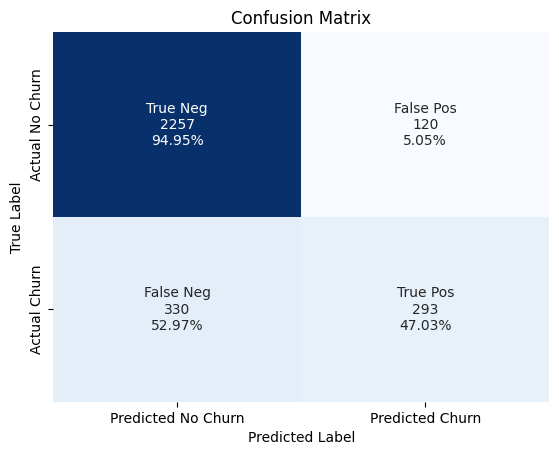

Accuracy: 0.85
Recall: 0.47
f1_score: 0.566
Precision: 0.709
y_train:
 (7000,)
y_test:
 (3000,)


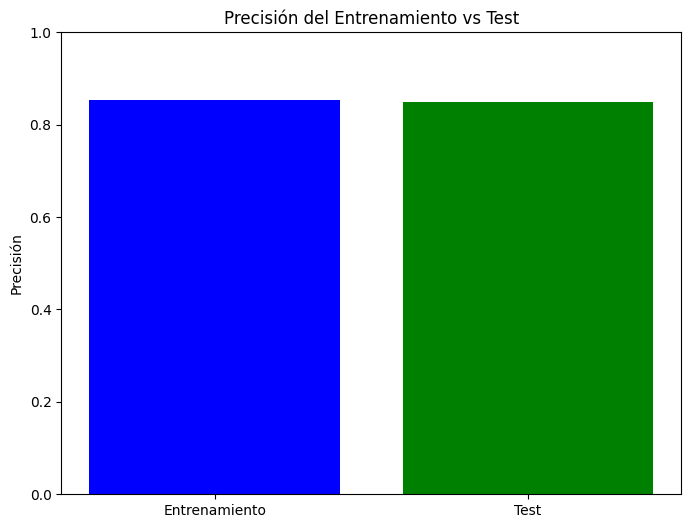

--------------------------------------------------
Modelo: XGBClassifier


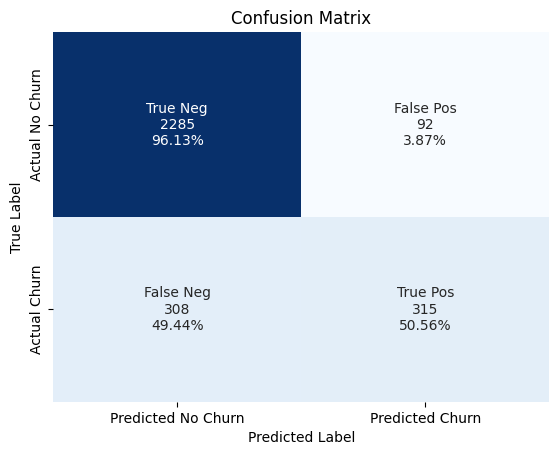

Accuracy: 0.867
Recall: 0.506
f1_score: 0.612
Precision: 0.774
y_train:
 (7000,)
y_test:
 (3000,)


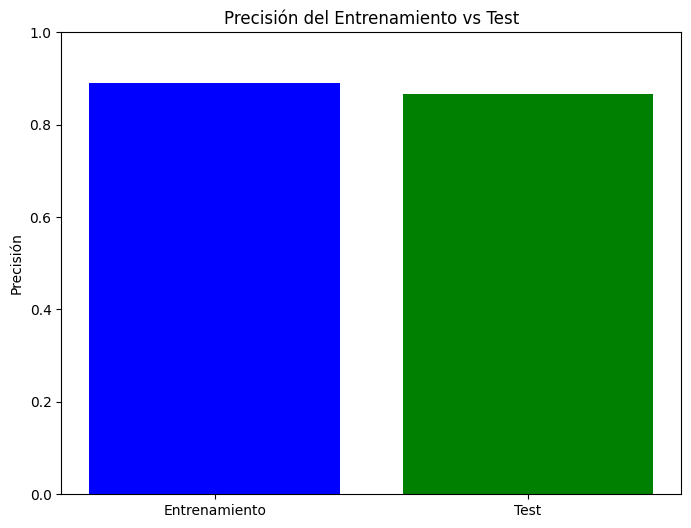

In [74]:
# Metodo 1
X= df[selected_features]
sampling="No Sampling"
df_metricas = entrenar_modelos (X)

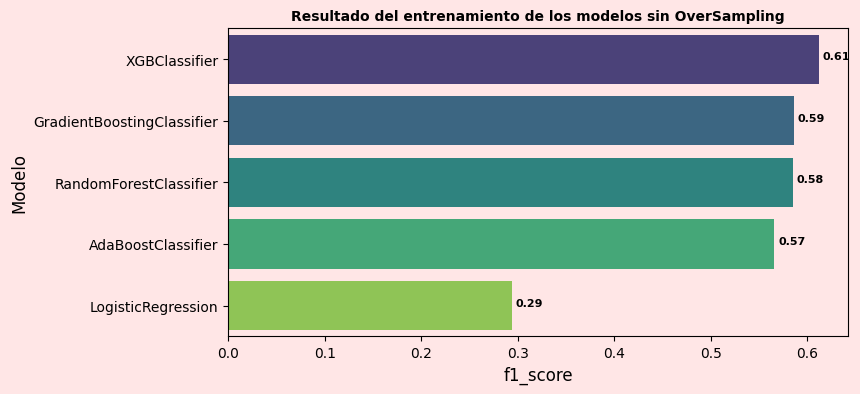

,Modelo,Sampling,Accuracy,Recall,f1_score,Precision
4,XGBClassifier,No Sampling,0.867,0.506,0.612,0.774
2,GradientBoostingClassifier,No Sampling,0.864,0.465,0.586,0.792
0,RandomForestClassifier,No Sampling,0.866,0.456,0.585,0.816
3,AdaBoostClassifier,No Sampling,0.850,0.470,0.566,0.709
1,LogisticRegression,No Sampling,0.806,0.194,0.294,0.605


In [76]:
Model_com=pd.DataFrame(df_metricas)
Model_com_df=Model_com.sort_values(by='f1_score',ascending=False)
plot_chart ("Resultado del entrenamiento de los modelos sin OverSampling")
print("")
Model1_com_df=Model_com_df.copy()
Model_com_df.sort_values(by='f1_score', ascending=False)

**Metodo 2:** Repito ahora pero aplicando RamdonOverSampler para balancear y corregir desbalanceo

X_train:
 (11170, 11)
X_test:
 (3000, 11)
y_train:
 (11170,)
y_test:
 (3000,)
--------------------------------------------------
Modelo: RandomForestClassifier


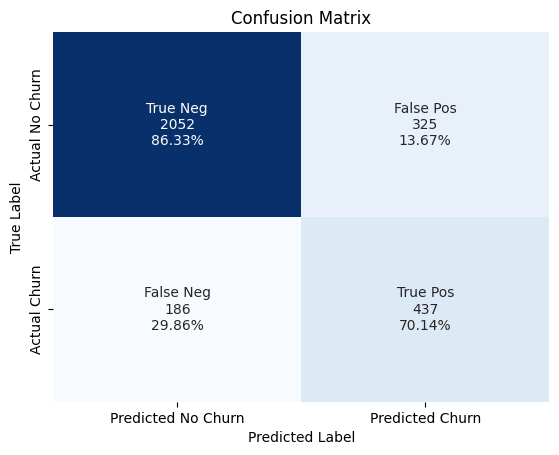

Accuracy: 0.83
Recall: 0.701
f1_score: 0.631
Precision: 0.573
y_train:
 (11170,)
y_test:
 (3000,)


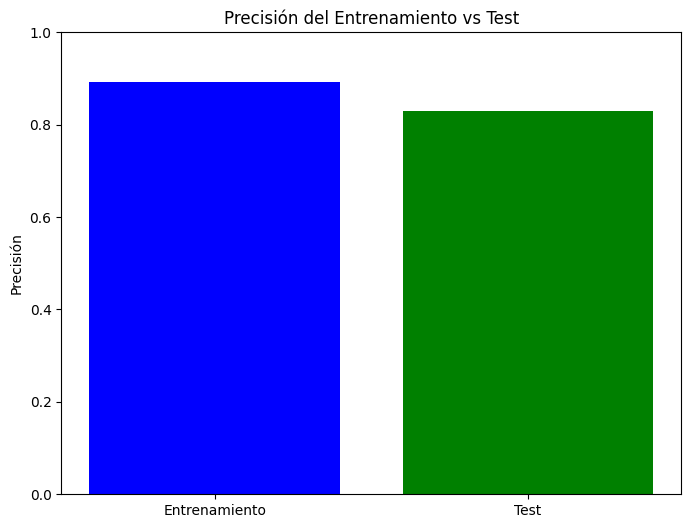

--------------------------------------------------
Modelo: LogisticRegression


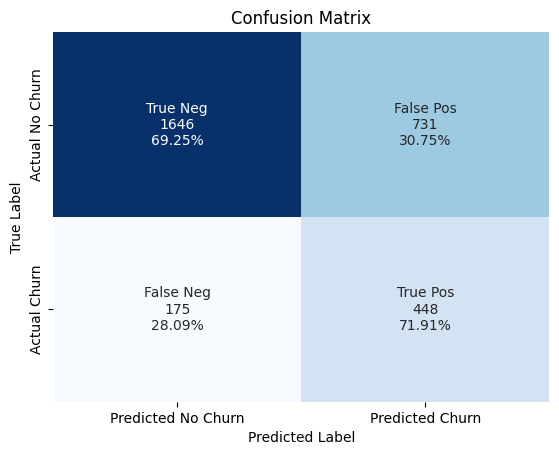

Accuracy: 0.698
Recall: 0.719
f1_score: 0.497
Precision: 0.38
y_train:
 (11170,)
y_test:
 (3000,)


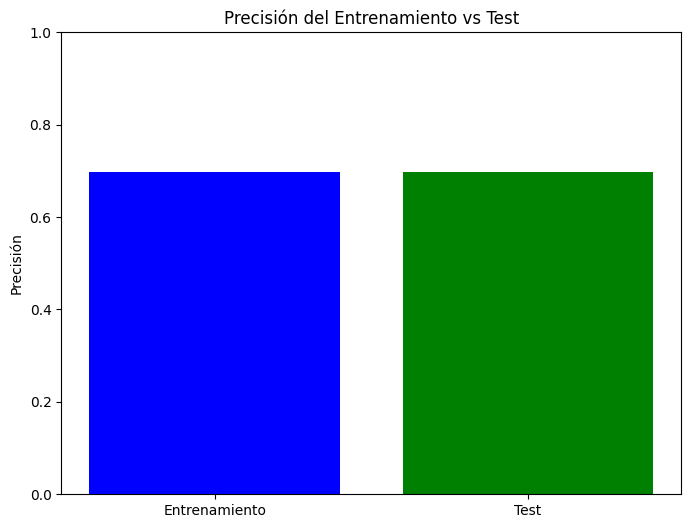

--------------------------------------------------
Modelo: GradientBoostingClassifier


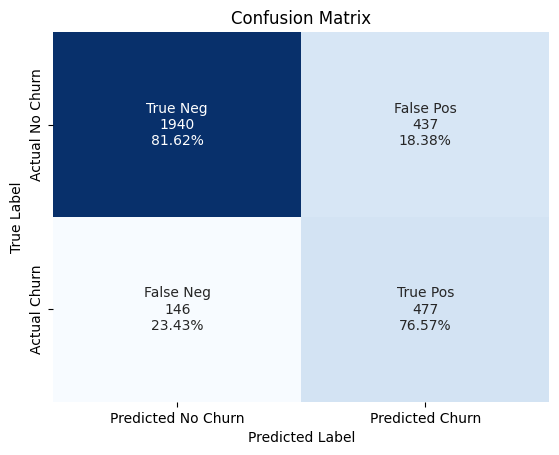

Accuracy: 0.806
Recall: 0.766
f1_score: 0.621
Precision: 0.522
y_train:
 (11170,)
y_test:
 (3000,)


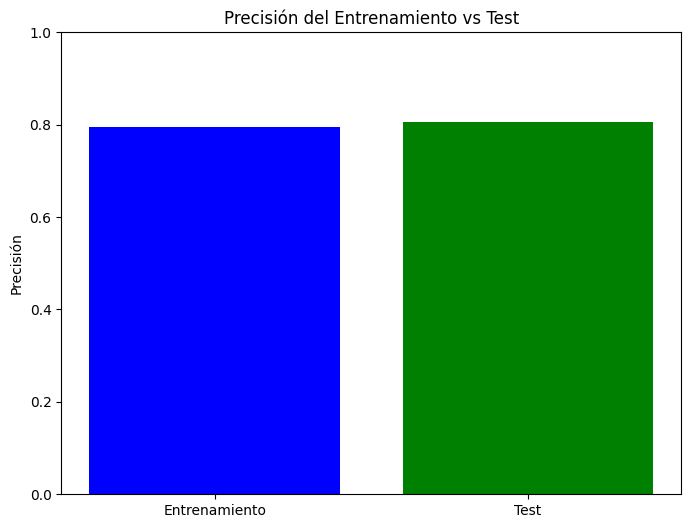

--------------------------------------------------
Modelo: AdaBoostClassifier


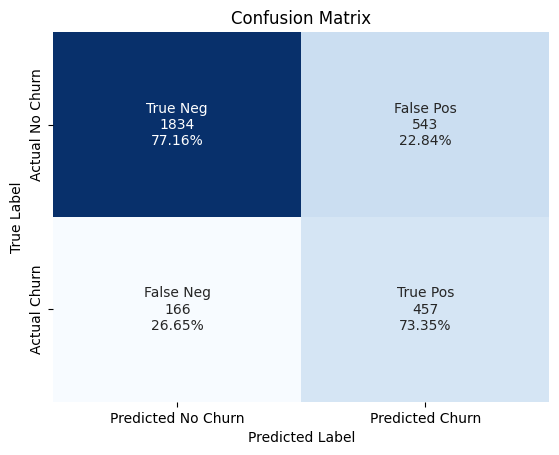

Accuracy: 0.764
Recall: 0.734
f1_score: 0.563
Precision: 0.457
y_train:
 (11170,)
y_test:
 (3000,)


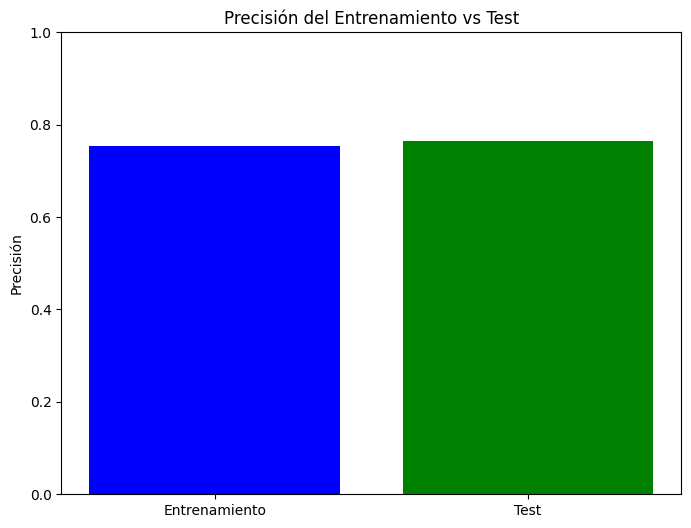

--------------------------------------------------
Modelo: XGBClassifier


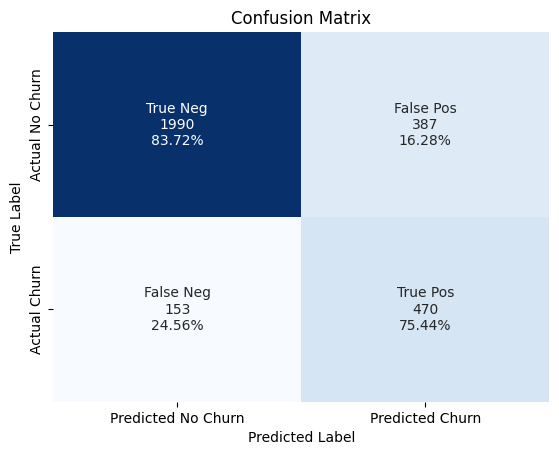

Accuracy: 0.82
Recall: 0.754
f1_score: 0.635
Precision: 0.548
y_train:
 (11170,)
y_test:
 (3000,)


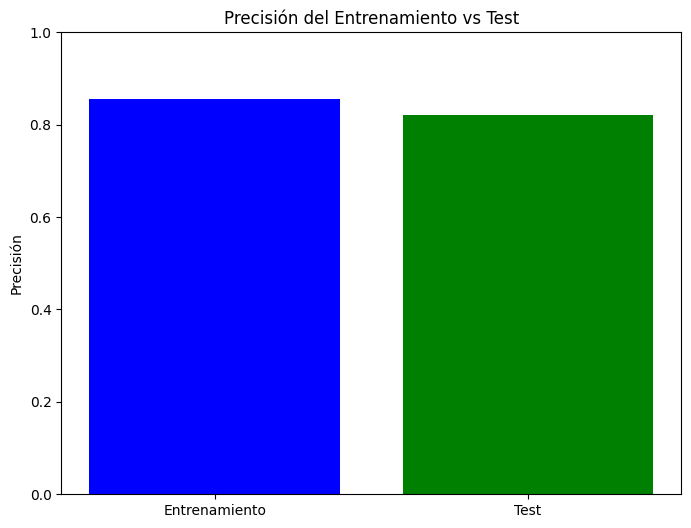

In [78]:
# Metodo 2
X= df[selected_features]
sampling="OverSamp."
df_metricas = entrenar_modelos (X)

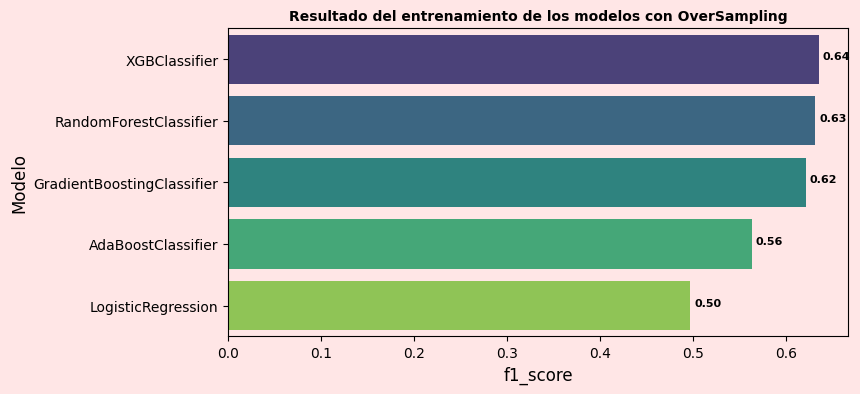

,Modelo,Sampling,Accuracy,Recall,f1_score,Precision
4,XGBClassifier,OverSamp.,0.820,0.754,0.635,0.548
0,RandomForestClassifier,OverSamp.,0.830,0.701,0.631,0.573
2,GradientBoostingClassifier,OverSamp.,0.806,0.766,0.621,0.522
3,AdaBoostClassifier,OverSamp.,0.764,0.734,0.563,0.457
1,LogisticRegression,OverSamp.,0.698,0.719,0.497,0.380


In [80]:
Model_com=pd.DataFrame(df_metricas)
Model_com_df=Model_com.sort_values(by='f1_score',ascending=False)
plot_chart ("Resultado del entrenamiento de los modelos con OverSampling")
print("")
Model2_com_df=Model_com_df.copy()
Model_com_df.sort_values(by='f1_score', ascending=False)

Vamos a hacer un mapa de calor que muestre como se han comportado todos los modelos entrenados

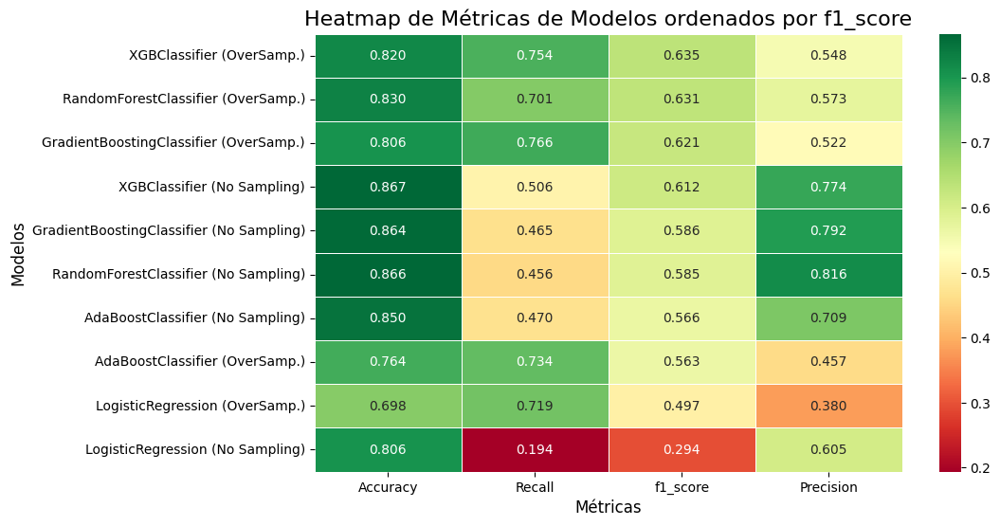

In [82]:
# Unir los DataFrames
combined_df = pd.concat([Model1_com_df, Model2_com_df], ignore_index=True)

# Modificar el nombre del modelo para incluir el tipo de muestreo entre paréntesis
combined_df['Modelo'] = combined_df.apply(lambda row: f"{row['Modelo']} ({row['Sampling']})", axis=1)

# Crear el heatmap sin incluir la columna 'Sampling'
plt.figure(figsize=(10, 6))
heatmap_data = combined_df.set_index('Modelo').drop(columns=['Sampling']).sort_values(by='f1_score', ascending=False)
sns.heatmap(heatmap_data, annot=True, cmap='RdYlGn', linewidths=.5, fmt='.3f')

# Configurar el título y las etiquetas
plt.title('Heatmap de Métricas de Modelos ordenados por f1_score', fontsize=16)
plt.xlabel('Métricas', fontsize=12)
plt.ylabel('Modelos', fontsize=12)
plt.show()

Como podemos ver, los resultados de los modelos muestran una **ligera mejora respecto al f1_score si aplicamos oversampling**

### 3.4 Selección de los dos mejores modelos y optimización (ajuste hiperparámetros).

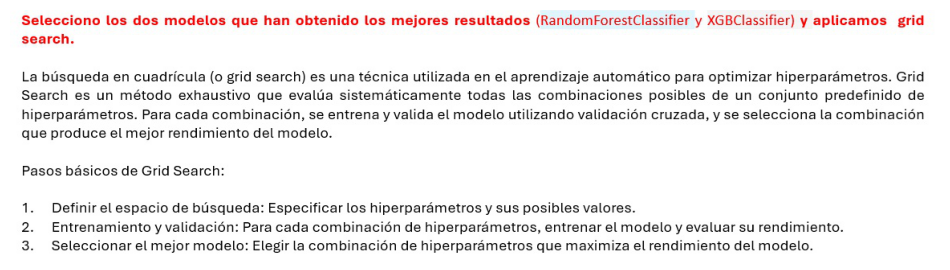

In [147]:
mostrar_imagen('c:/Phyton/Grid.jpg')

In [84]:
from xgboost import XGBClassifier, plot_importance

def entrenar_modelos_grid (X):
    
    df_metricas = pd.DataFrame(columns=['Modelo', 'Accuracy', 'Recall', 'f1_score', 'Precision'])
    X= df[selected_features]
    y= df['Exited']
    
    if sampling == "No":
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
    else:
        #Aplicación RandomOverSampler para correfgir desequilibrio
        # Dividir los datos en conjuntos de entrenamiento y prueba
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

        # Aplicar RandomOverSampler solo al conjunto de entrenamiento
        rand_over_samp = RandomOverSampler(random_state=42)
        X_train, y_train = rand_over_samp.fit_resample(X_train, y_train)

    scaler = StandardScaler()
    scaled_X_train = scaler.fit_transform(X_train)
    scaled_X_test = scaler.transform(X_test)

    modelos = {
        'XGBClassifier': {
            'model': XGBClassifier(objective='binary:logistic', nthread=4, seed=42),
            'params': {
                'max_depth': [5, 7], 
                'n_estimators': [100, 200],
                'learning_rate': [0.01, 0.005],
                'min_samples_split': [50],
                'learning_rate': [0.01, 0.05],
                'booster': ['gbtree'],
                'reg_lambda': [1.0, 2.0],
                'eval_metric': ['logloss'],
                'reg_alpha': [0.1, 0.5],
                'min_samples_leaf': [30]
            }
        },
        'RandomForestClassifier': {
    'model': RandomForestClassifier(random_state=42),
    'params': {
        'n_estimators': [100, 200],
        'max_depth': [5, 10],
        'min_samples_split': [20],
        'min_samples_leaf': [10],
        'criterion': ['gini', 'entropy']  # Añadido el criterio
    }
}
    }

#n_estimators: Este parámetro define el número de árboles en el bosque. Un mayor número de árboles puede mejorar la precisión del modelo,
#pero también incrementa el tiempo de entrenamiento.
#max_depth: Este parámetro establece la profundidad máxima de cada árbol. None significa que los nodos se expanden hasta que todas las hojas
#son puras o contienen menos muestras que min_samples_split. Las profundidades de 10, 20 y 30 limitan la profundidad de los árboles,
#lo que puede ayudar a prevenir el sobreajuste.
#min_samples_split: Este parámetro indica el número mínimo de muestras requeridas para dividir un nodo interno. Valores más altos pueden 
#llevar a árboles más generales.
#min_samples_leaf: Este parámetro define el número mínimo de muestras que debe tener una hoja. Valores más altos pueden suavizar el modelo.
#Estos hiperparámetros te permiten ajustar el modelo para encontrar el equilibrio adecuado entre sesgo y varianza, mejorando así su
#rendimiento en datos no vistos.
#learning_rate: Este parámetro controla la tasa de aprendizaje del modelo. Valores más bajos hacen que el modelo aprenda más lentamente,
#lo que puede resultar en un mejor rendimiento general, pero requiere más iteraciones
    
    num = 0
    for model_name, model_info in modelos.items():
        print("-" * 50)
        print(f'Modelo: {model_name}')

        grid_search = GridSearchCV(estimator=model_info['model'], param_grid=model_info['params'], scoring='f1', refit=True, n_jobs=-1, cv=5, verbose=1)
        grid_search.fit(scaled_X_train, y_train)

        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(scaled_X_test)

        # Imprimir el reporte de clasificación
        print(classification_report(y_test, y_pred))
        evaluationModel(y_test, y_pred)

        accuracy = round(accuracy_score(y_test, y_pred), 3)
        recall = round(recall_score(y_test, y_pred), 3)
        f1 = round(f1_score(y_test, y_pred), 3)
        precision = round(precision_score(y_test, y_pred), 3)

        print("Accuracy:", accuracy)
        print("Recall:", recall)
        print("f1_score:", f1)
        print("Precision:", precision)
        print("Best Params:", grid_search.best_params_)

        # Graficar la precisión del entrenamiento vs el test
        graficar_precision(best_model, scaled_X_train, y_train, scaled_X_test, y_test)

        df_metricas.loc[num] = [model_name, accuracy, recall, f1, precision]

        # Predecir probabilidades sobre el conjunto de prueba
        y_prob = best_model.predict_proba(scaled_X_test)[:, 1]  # Probabilidad de la clase 1

        # Calcular la curva ROC y el AUC
        fpr, tpr, thresholds = roc_curve(y_test, y_prob)
        roc_auc = roc_auc_score(y_test, y_prob)

        # Graficar la curva ROC
        plt.figure(figsize=(10, 6))
        plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='red', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve')
        plt.legend(loc='lower right')
        plt.show()

        # Si el modelo es RandomForestClassifier, graficar la importancia de las características
        if model_name == 'RandomForestClassifier':
            importances = best_model.feature_importances_
            indices = np.argsort(importances)[::-1]
            plt.figure(figsize=(10, 6))
            plt.title("Feature Importances")
            plt.bar(range(X.shape[1]), importances[indices], align="center")
            plt.xticks(range(X.shape[1]), [selected_features[i] for i in indices], rotation=90)
            plt.xlim([-1, X.shape[1]])
            plt.show()
            
        # añadir resultados de los modelos optimizados
        long = len(combined_df)
        #combined_df.loc[long] = [type(modelo).__name__, 'OverSamp', accuracy, recall,f1,precision]
        combined_df.loc[long] = [f"{type(model_info['model']).__name__}_(Optimizado)", 'OverSamp', accuracy, recall, f1, precision]
        num = num +1

    return df_metricas

--------------------------------------------------
Modelo: XGBClassifier
Fitting 5 folds for each of 32 candidates, totalling 160 fits
              precision    recall  f1-score   support

           0       0.92      0.86      0.89      2377
           1       0.58      0.71      0.64       623

    accuracy                           0.83      3000
   macro avg       0.75      0.79      0.76      3000
weighted avg       0.85      0.83      0.84      3000



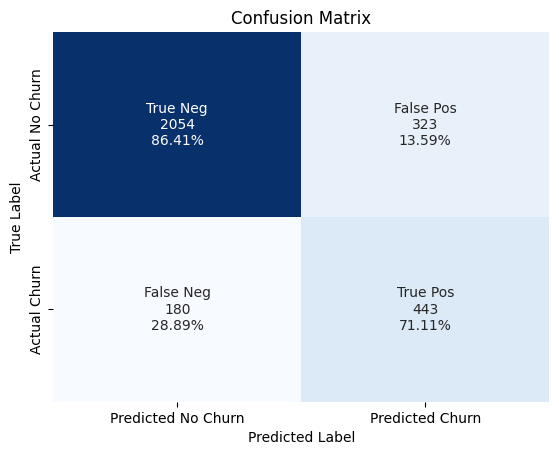

Accuracy: 0.832
Recall: 0.711
f1_score: 0.638
Precision: 0.578
Best Params: {'booster': 'gbtree', 'eval_metric': 'logloss', 'learning_rate': 0.05, 'max_depth': 7, 'min_samples_leaf': 30, 'min_samples_split': 50, 'n_estimators': 200, 'reg_alpha': 0.5, 'reg_lambda': 1.0}


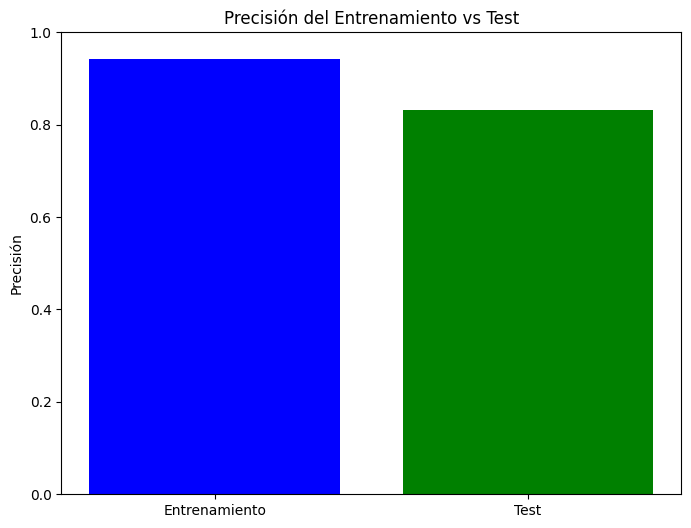

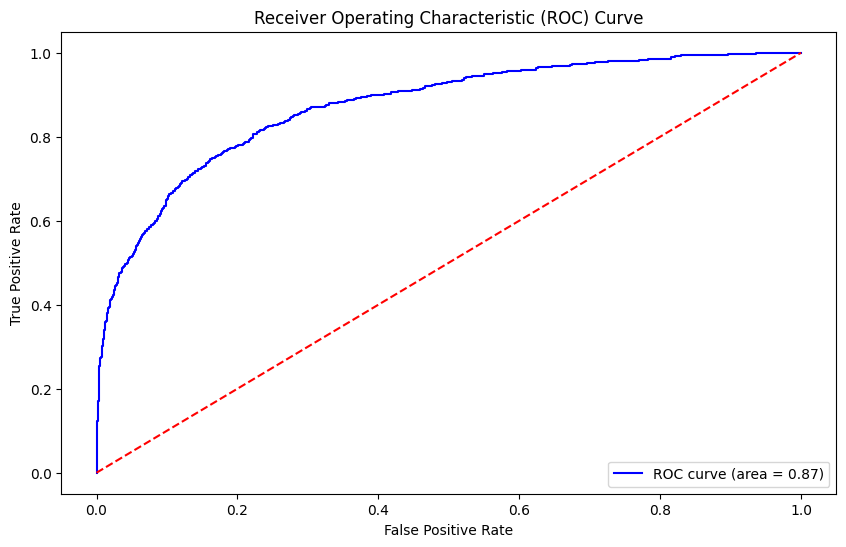

--------------------------------------------------
Modelo: RandomForestClassifier
Fitting 5 folds for each of 8 candidates, totalling 40 fits
              precision    recall  f1-score   support

           0       0.92      0.85      0.89      2377
           1       0.56      0.72      0.63       623

    accuracy                           0.82      3000
   macro avg       0.74      0.79      0.76      3000
weighted avg       0.85      0.82      0.83      3000



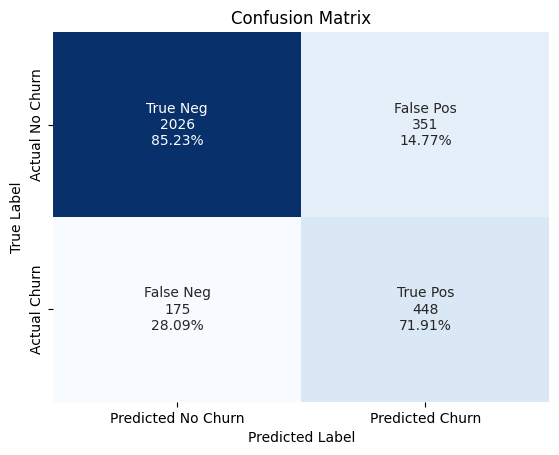

Accuracy: 0.825
Recall: 0.719
f1_score: 0.63
Precision: 0.561
Best Params: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 20, 'n_estimators': 200}


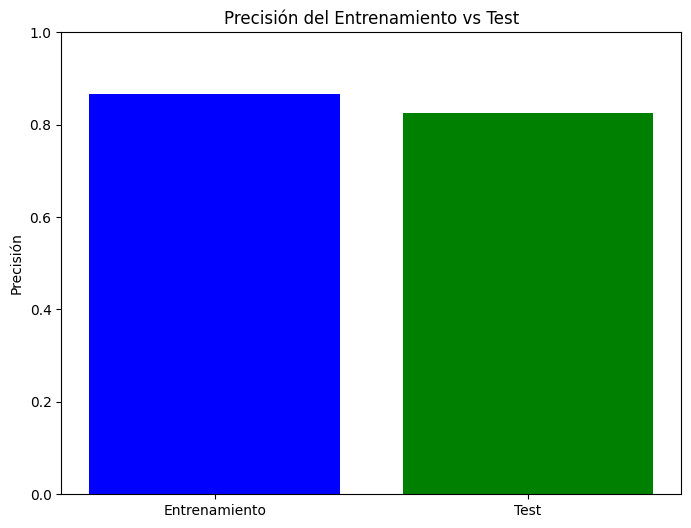

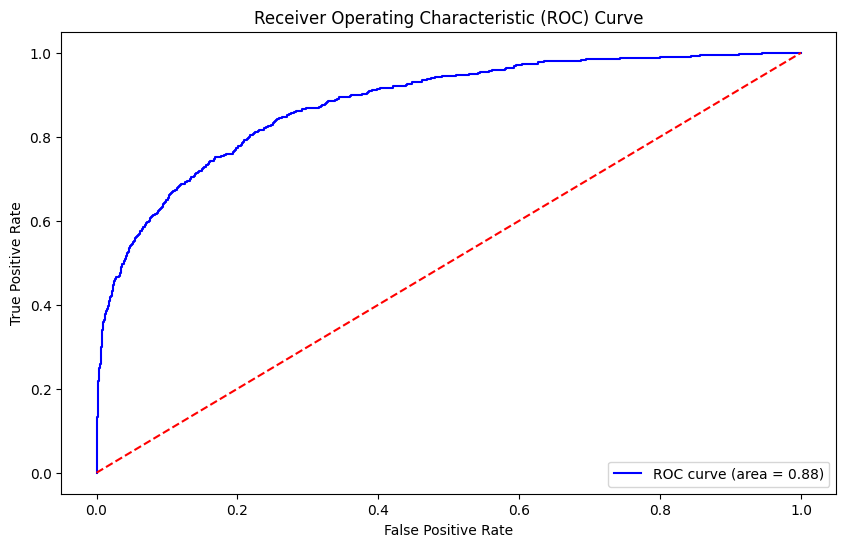

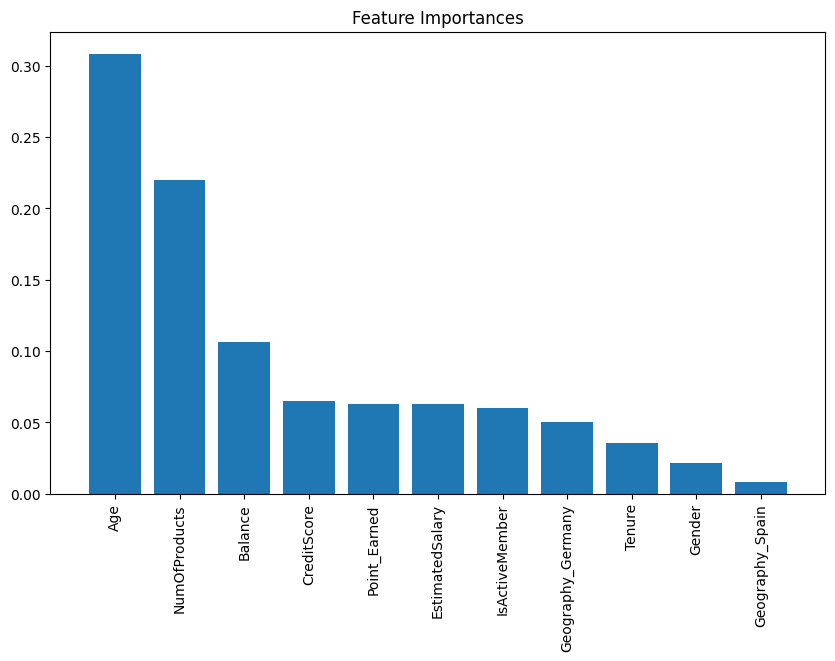

In [86]:
# Ajuste mejores modelos con Grid y aplico RamdonOverSampler
sampling="RandomOverSampler"
df_metricas = entrenar_modelos_grid (X)

No hemos mejorado mucho los modelos aplicando grid search ya que aumentar determinados hiperparametros origina overfitting, esto es, un rendimiento significativamente mas alto en el entrenamiento que en el test.

<span style="font-size:24px; color:red; font-weight:bold">4. Modelo final</span>

In [87]:
df_metricas.sort_values(by='f1_score',ascending=False)

,Modelo,Accuracy,Recall,f1_score,Precision
0,XGBClassifier,0.832,0.711,0.638,0.578
1,RandomForestClassifier,0.825,0.719,0.630,0.561


Elegimos cómo **mejor modelo el RandomForestClassifier,** pues tiene un buen rendimiento y, aunque el XGBClassifier obtiene resultados ligeramente superiores, muestra cierto grado de overfitting. 
RandomForestClassifier **es capaz de predecir de forma correcta el 71,9% de los clientes que abandonan el banco**, con un Accuracy alto de 0,825.. 

In [90]:
combined_df.sort_values(by='f1_score', ascending=False)

,Modelo,Sampling,Accuracy,Recall,f1_score,Precision
10,XGBClassifier_(Optimizado),OverSamp,0.832,0.711,0.638,0.578
5,XGBClassifier (OverSamp.),OverSamp.,0.820,0.754,0.635,0.548
6,RandomForestClassifier (OverSamp.),OverSamp.,0.830,0.701,0.631,0.573
11,RandomForestClassifier_(Optimizado),OverSamp,0.825,0.719,0.630,0.561
7,GradientBoostingClassifier (OverSamp.),OverSamp.,0.806,0.766,0.621,0.522
0,XGBClassifier (No Sampling),No Sampling,0.867,0.506,0.612,0.774
1,GradientBoostingClassifier (No Sampling),No Sampling,0.864,0.465,0.586,0.792
2,RandomForestClassifier (No Sampling),No Sampling,0.866,0.456,0.585,0.816
3,AdaBoostClassifier (No Sampling),No Sampling,0.850,0.470,0.566,0.709
8,AdaBoostClassifier (OverSamp.),OverSamp.,0.764,0.734,0.563,0.457


In [92]:
# Guardamos los resultados de los modelos
combined_df.to_csv('c:/Phyton/ResultadosModelos.csv', index=False)

### 4.1 Añadir las probabilidades obtenidas por el modelo al dataset 

In [94]:
# Predecir probabilidades y añadirlas al df

X= df[selected_features]
y= df['Exited']

#Aplicación RandomOverSampler para correfgir desequilibrio
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Aplicar RandomOverSampler solo al conjunto de entrenamiento
rand_over_samp = RandomOverSampler(random_state=42)
X_train, y_train = rand_over_samp.fit_resample(X_train, y_train)

scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)
scaled_X = scaler.transform(X)  # Escalar todo el DataFrame

modelo = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_split=20, min_samples_leaf=10, n_estimators=200, random_state=42)
modelo.fit(scaled_X_train, y_train)

# Predecir probabilidades sobre todo el DataFrame
y_prob = modelo.predict_proba(scaled_X)[:, 1]  # Probabilidad de la clase 1

# Añadir las probabilidades al DataFrame original
df['Probabilidad_Exit'] = y_prob
df['Exited_pred'] = df['Probabilidad_Exit'].apply(lambda x: 1 if x > 0.5 else 0)

In [96]:
df

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Satisfaction_Score,Point_Earned,Geography_Germany,Geography_Spain,Card_Type_GOLD,Card_Type_PLATINUM,Card_Type_SILVER,Probabilidad_Exit,Exited_pred
0,619,0,42,2,0.00,1,1,1,101348.88,1,2,464,False,False,False,False,False,0.614486,1
1,608,0,41,1,83807.86,1,0,1,112542.58,0,3,456,False,True,False,False,False,0.338854,0
2,502,0,42,8,159660.80,3,1,0,113931.57,1,3,377,False,False,False,False,False,0.952294,1
3,699,0,39,1,0.00,2,0,0,93826.63,0,5,350,False,False,True,False,False,0.321354,0
4,850,0,43,2,125510.82,1,1,1,79084.10,0,5,425,False,True,True,False,False,0.379480,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,1,39,5,0.00,2,1,0,96270.64,0,1,300,False,False,False,False,False,0.114690,0
9996,516,1,35,10,57369.61,1,1,1,101699.77,0,5,771,False,False,False,True,False,0.275826,0
9997,709,0,36,7,0.00,1,0,1,42085.58,1,3,564,False,False,False,False,True,0.234830,0
9998,772,1,42,3,75075.31,2,1,0,92888.52,1,2,339,True,False,True,False,False,0.469482,0


### 4.2 Segmentación de nuestra cartera de clientes y descripción de cada segmento en función de las características más relevantes

A continuación vamos a segmentar nuestra cartera de clientes en función de la probabilidad de abandono, para lo que
entrenaremos un RandomForestClassifier pero con los hiperparametros min_samples_split=1000 y min_samples_leaf=30 ajustados
Con el fin de obtener un numero reducido de segmentos con distinto comportamiento frente al churn.

Las 5 características más importantes son: ['Age', 'NumOfProducts', 'IsActiveMember', 'Geography_Germany', 'Balance']


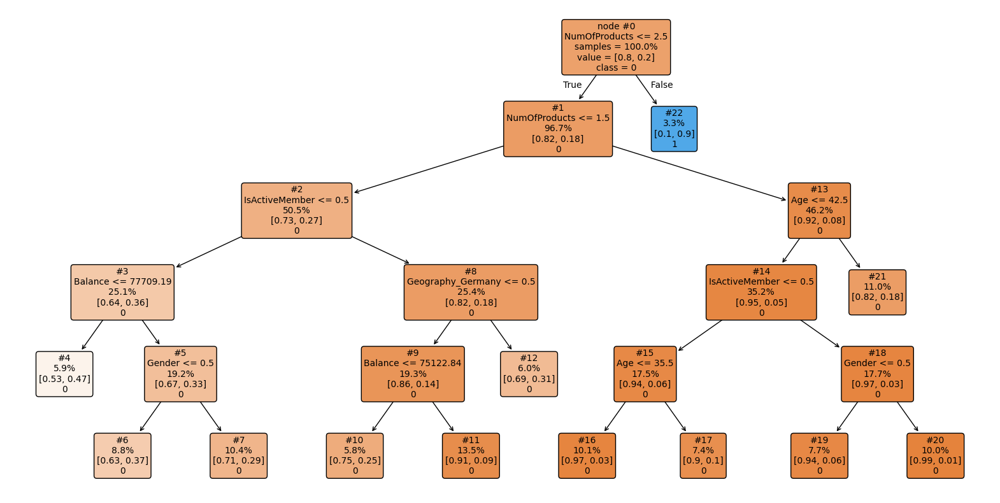

El número de segmentos son : 12


In [98]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Selecciona las características principales y la columna de probabilidades
X= df[selected_features]
y= df['Exited']

#Aplicación RandomOverSampler para correfgir desequilibrio
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Aplicar RandomOverSampler solo al conjunto de entrenamiento
rand_over_samp = RandomOverSampler(random_state=42)
X_train, y_train = rand_over_samp.fit_resample(X_train, y_train)

scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)
scaled_X = scaler.transform(X)  # Escalar todo el DataFrame

forest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_split=1000, min_samples_leaf=30, n_estimators=200, random_state=42)
forest.fit(X, y)

#Obtener las importancias de las características
importances = forest.feature_importances_
features = selected_features

# Crear un DataFrame para ordenar las características por importancia
importances_df = pd.DataFrame({'Feature': features, 'Importance': importances})
importances_df = importances_df.sort_values(by='Importance', ascending=False)

#Seleccionar las 5 características más importantes
top_5_features = importances_df['Feature'].head(5).tolist()
print("Las 5 características más importantes son:", top_5_features)

# Selecciona uno de los árboles del bosque aleatorio
arbol_individual = forest.estimators_[0]

# Visualiza el árbol de decisión
plt.figure(figsize=(20, 10))
plot_tree(arbol_individual, feature_names=features, filled=True, rounded=True, fontsize=10, 
          proportion=True, impurity=False, class_names=['0', '1'], 
          node_ids=True, label='root', precision=2)

plt.show()

# Obtener las probabilidades de la clase exited=1 para un arbol individual
#probabilidades = forest.predict_proba(X)[:, 1]
probabilidades = arbol_individual.predict_proba(X)[:, 1]

# Añadir las probabilidades al DataFrame original
df['prob_exited_1_reducido'] = probabilidades

# Obtener los índices de los nodos hoja
nodos_hoja = arbol_individual.apply(X)

# Asignar los índices de los nodos hoja a la nueva columna 'nodo' en 'df'
df['Leaf_Node'] = nodos_hoja

print("El número de segmentos son :", df['Leaf_Node'].nunique())

El número de segmentos obtenidos es: 12


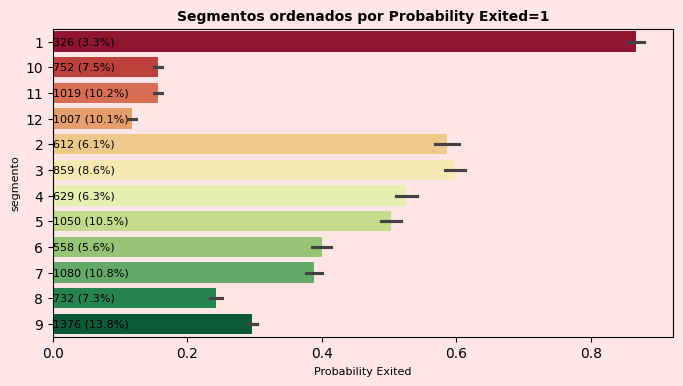


---------------------------------------
Descripción de los segmentos en función de las caracteristicas más relevantes:

          Clientes  %casos  Prob.churn  Edad media  media productos  %clie.Alemania  %clie.IsActiveMember  media balance
segmento                                                                                                                
1              326     3.3        89.7        43.6              3.2            37.0                  44.0        78821.8
2              612     6.1        47.4        40.1              1.0             6.0                   0.0        14304.5
3              859     8.6        37.4        39.4              1.0            41.0                   0.0       123877.4
4              629     6.3        31.4        40.5              1.0           100.0                 100.0       119531.7
5             1050    10.5        29.2        38.3              1.0            31.0                   0.0       126082.7
6              558     5.6      

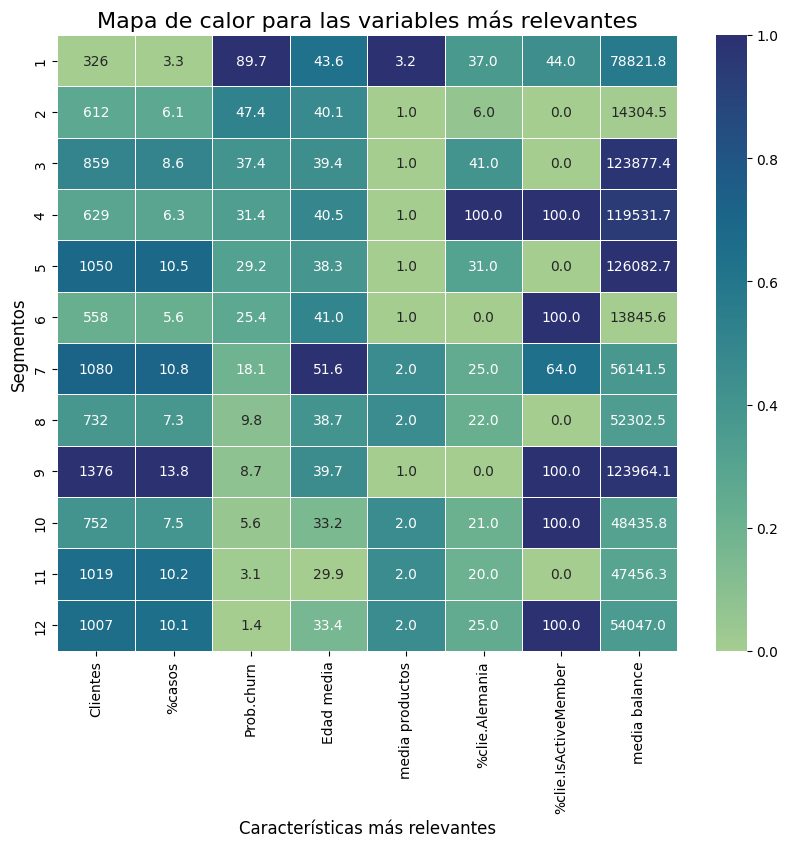

In [106]:
# Contar el número de valores distintos en 'prob_exited_1_reducido'
num_valores_distintos = df['prob_exited_1_reducido'].nunique()

# Imprimir el resultado
print(f"El número de segmentos obtenidos es: {num_valores_distintos}")

# Obtener los valores únicos y ordenarlos de mayor a menor
valores_unicos_ordenados = sorted(df['prob_exited_1_reducido'].unique(), reverse=True)

# Crear un diccionario para mapear los valores únicos a los segmentos
mapeo_segmentos = {valor: i+1 for i, valor in enumerate(valores_unicos_ordenados)}

# Asignar los segmentos al DataFrame usando el mapeo
df['segmento'] = df['prob_exited_1_reducido'].map(mapeo_segmentos)

# Calcular el número de casos para cada segmento
num_casos_por_segmento = df.groupby('segmento').size()

# Calcular la media de la probabilidad de salida multiplicada por 100 para cada segmento
media_probabilidad_exit_por_segmento = df.groupby('segmento')['prob_exited_1_reducido'].mean() * 100
media_edad = df.groupby('segmento')['Age'].mean().round(1)
media_num_prod = df.groupby('segmento')['NumOfProducts'].mean().round(1)
media_balance = df.groupby('segmento')['Balance'].mean().round(1)

# Calcular el número total de casos
total_cases = df.shape[0]

# Calcular el número de casos donde Geography_Germany=1 para cada segmento
casos_alemania_por_segmento = df[df['Geography_Germany'] == 1].groupby('segmento').size()

#Calcular el porcentaje de casos de Alemania sobre el total de casos en cada segmento
porcentaje_casos_alemania = (casos_alemania_por_segmento / num_casos_por_segmento) * 100

# Calcular el número de casos donde IsActiveMember=1 para cada segmento
casos_IsActiveMember_segmento = df[df['IsActiveMember'] == 1].groupby('segmento').size()

#Calcular el porcentaje de casos de IsActiveMember=1 sobre el total de casos en cada segmento
porcentaje_casos_IsActiveMember = (casos_IsActiveMember_segmento / num_casos_por_segmento) * 100

# Reemplaza los valores NaN por 0
porcentaje_casos_alemania.fillna(0, inplace=True)
porcentaje_casos_IsActiveMember.fillna(0, inplace=True)

# Crear un nuevo DataFrame con los resultados
resultados_df = pd.DataFrame({
    'Clientes': num_casos_por_segmento,
    '%casos': (num_casos_por_segmento/ total_cases) * 100,
    'Prob.churn': media_probabilidad_exit_por_segmento,
    'Edad media': media_edad,
    'media productos': media_num_prod,
    '%clie.Alemania': porcentaje_casos_alemania,
    '%clie.IsActiveMember': porcentaje_casos_IsActiveMember,
    'media balance': media_balance,
})

# Redondear los valores a un decimal
resultados_df['Prob.churn'] = resultados_df['Prob.churn'].round(1)
resultados_df['%casos'] = resultados_df['%casos'].round(1)
resultados_df['%clie.Alemania'] = resultados_df['%clie.Alemania'].round(0)
resultados_df['%clie.IsActiveMember'] = resultados_df['%clie.IsActiveMember'].round(0)

# Grafico de probabilidad de churn por smapeo_segmentos

#Asegurarse de que 'segmento' es categórico
df['segmento'] = df['segmento'].astype(str)

# Ordenar el DataFrame por 'Probability Exited=1'
df = df.sort_values(by='segmento', ascending=True)

# Configurar la figura
fig, ax = plt.subplots(figsize=(8, 4))
background_color = "#ffe6e6"
fig.patch.set_facecolor(background_color)
ax.set_facecolor(background_color)

# Crear una paleta de colores de rojo a verde
n = df['segmento'].nunique()
colores = plt.cm.RdYlGn(np.linspace(0, 1, n)).tolist()  # Convertir a lista

# Crear el gráfico de barras horizontal con la nueva paleta de colores
sns.barplot(x='Probabilidad_Exit', y='segmento', hue='segmento', data=df, ax=ax, palette=colores, dodge=False, legend=False)

# Añadir etiquetas y título
ax.set_title('Segmentos ordenados por Probability Exited=1', fontsize=10, fontweight='bold')
ax.set_xlabel('Probability Exited', fontsize=8)
ax.set_ylabel('segmento', fontsize=8)

df_totals = df['segmento'].value_counts().reset_index()
df_totals.columns = ['segmento', 'total']
df_totals['percentage'] = (df_totals['total'] / df_totals['total'].sum()) * 100

# Añadir el total de registros y el porcentaje sobre el total en las etiquetas
for i, segmento in enumerate(df['segmento'].unique()):
    total = df_totals[df_totals['segmento'] == segmento]['total'].values[0]
    percentage = df_totals[df_totals['segmento'] == segmento]['percentage'].values[0]
    ax.text(0, i, f"{total} ({percentage:.1f}%)", color='black', ha="left", va="center", fontsize=8)

# Mostrar el gráfico
plt.show()


# Mostrar los resultados
print()
print('---------------------------------------')
print(f"Descripción de los segmentos en función de las caracteristicas más relevantes:")
print()
print(resultados_df.to_string())
print()

# Creamos un mapa de calor

# Normalizar los datos para la coloración
scaler = MinMaxScaler()
resultados_normalizados = pd.DataFrame(scaler.fit_transform(resultados_df), index=resultados_df.index, columns=resultados_df.columns)

# Crear anotaciones con los valores originales
annot = resultados_df.round(2).astype(str)

# Crear el heatmap con los datos normalizados y anotaciones originales
plt.figure(figsize=(10, 8))
sns.heatmap(resultados_normalizados, annot=annot, fmt='', cmap='crest', linewidths=.5)

# Configurar el título y las etiquetas
plt.title('Mapa de calor para las variables más relevantes', fontsize=16)
plt.xlabel('Características más relevantes', fontsize=12)
plt.ylabel('Segmentos', fontsize=12)
plt.show()

Vemos que obtenemos **12 segmentos con probabilidades significativamente distintas**. Si queremos obtener más segmentos
tan sólo tenemos que ejecutar el modelo RandomForestClassifier ajustando el valor de los hiperparametros min_samples_split=1000
y min_samples_leaf=30.

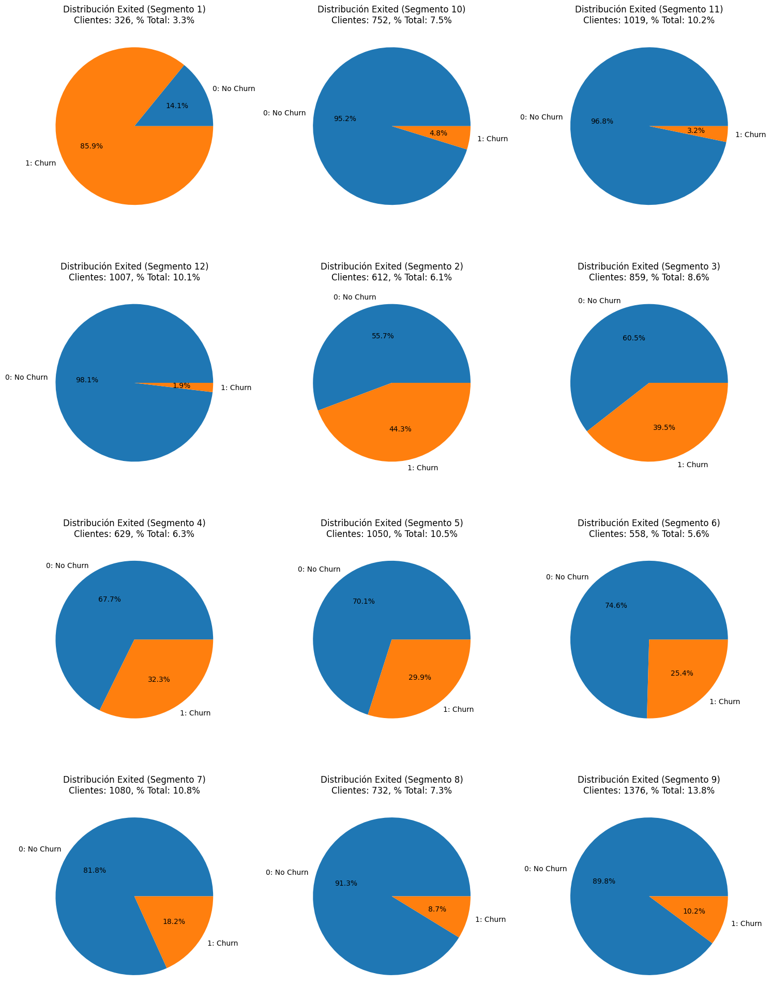

In [112]:
# Obtener los valores únicos de 'segmento'
valores_segmento = sorted(df['segmento'].unique())

# Determinar el número de filas necesarias para tres columnas
num_filas = len(valores_segmento) // 3 + (len(valores_segmento) % 3 > 0)

# Crear una figura con subplots en tres columnas
fig, axs = plt.subplots(num_filas, 3, figsize=(15, num_filas*5))

# Aplanar el array de ejes para facilitar el acceso
axs = axs.flatten()

# Inicializar un contador para los subplots
contador_subplot = 0

# Obtener el número total de casos
total_cases = df.shape[0]

for segmento in valores_segmento:
    # Filtrar el DataFrame por el segmento actual
    subset_df = df[df['segmento'] == segmento]
    
    # Contar los valores de 'Exited' para el segmento actual
    counts = subset_df['Exited'].value_counts()
    
    # Crear las etiquetas para el gráfico
    labels = ['0: No Churn', '1: Churn']
    
    # Asegurarse de que ambas categorías estén presentes
    sizes = [counts.get(0, 0), counts.get(1, 0)]
    
    # Calcular el porcentaje de casos para el segmento actual
    porcentaje_casos = (subset_df.shape[0] / total_cases) * 100
    
    # Crear el gráfico de pastel en el subplot correspondiente
    axs[contador_subplot].pie(sizes, labels=labels, autopct='%.1f%%')
    axs[contador_subplot].set_title(f'Distribución Exited (Segmento {segmento})\nClientes: {subset_df.shape[0]}, % Total: {porcentaje_casos:.1f}%')
    
    # Incrementar el contador de subplots
    contador_subplot += 1

# Ocultar los ejes vacíos si los hay
for i in range(contador_subplot, len(axs)):
    axs[i].axis('off')

# Ajustar el espacio entre los gráficos
plt.tight_layout()

# Mostrar la figura
plt.show()


<span style="font-size:24px; color:red; font-weight:bold">6. Deep Learning: Creación de un Multilayer Perceptron (MLP)</span>

A continuación aplicare un modelo de Deep Learning, en concreto construiremos un **Multilayer Perceptron (MLP)**, que es un tipo de red neuronal artificial que se utiliza comúnmente para problemas de clasificación y regresión. En el contexto de un modelo de churn bancario, un MLP puede ayudar a predecir si un cliente abandonará el banco basándose en diversas características.

Los resultados del MLP serán comparados con los modelos de Machine Learning que desarrollamos anteriormente (Ver ChurnBanksModelos(Parte2)).

In [144]:
# Importamos Dataset ya trabajado con EDA
df=pd.read_csv('c:/Phyton/Customer-Churn-RecordsEDA.csv')
df.head()

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Satisfaction_Score,Point_Earned,Geography_Germany,Geography_Spain,Card_Type_GOLD,Card_Type_PLATINUM,Card_Type_SILVER
0,619,0,42,2,0.00,1,1,1,101348.88,1,2,464,False,False,False,False,False
1,608,0,41,1,83807.86,1,0,1,112542.58,0,3,456,False,True,False,False,False
2,502,0,42,8,159660.80,3,1,0,113931.57,1,3,377,False,False,False,False,False
3,699,0,39,1,0.00,2,0,0,93826.63,0,5,350,False,False,True,False,False
4,850,0,43,2,125510.82,1,1,1,79084.10,0,5,425,False,True,True,False,False


In [146]:
# Importamos resultados de los modelos anteriores para compararlos
df_Resultados=pd.read_csv('c:/Phyton/ResultadosModelos.csv')

In [148]:
# definimos funciones vamos a utilizar
import itertools

def metricas_matriz(y_test, y_pred):
    # Calcular la matriz de confusión
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Normalizar la matriz de confusión por filas (por el verdadero valor)
    conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

    # Dibujar la matriz de confusión
    plt.imshow(conf_matrix_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix')
    plt.colorbar()
    tick_marks = np.arange(len(np.unique(y_test)))
    plt.xticks(tick_marks, np.unique(y_test))
    plt.yticks(tick_marks, np.unique(y_test))

    # Añadir etiquetas a las celdas con porcentajes sobre la fila
    fmt = '.2f'
    thresh = conf_matrix_normalized.max() / 2.
    for i, j in itertools.product(range(conf_matrix_normalized.shape[0]), range(conf_matrix_normalized.shape[1])):
        plt.text(j, i, f'{conf_matrix[i, j]} ({conf_matrix_normalized[i, j] * 100:.2f}%)',
                 horizontalalignment="center",
                 color="white" if conf_matrix_normalized[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

    # Calcular métricas
    accuracy = accuracy_score(y_test, y_pred) * 100
    precision = precision_score(y_test, y_pred, average='binary') * 100
    recall = recall_score(y_test, y_pred, average='binary') * 100
    f1 = f1_score(y_test, y_pred, average='binary') * 100

    print(f"Model Accuracy: {accuracy:.2f}%")
    print(f"Model Precision: {precision:.2f}%")
    print(f"Model Recall: {recall:.2f}%")
    print(f"Model F1-Score: {f1:.2f}%")

    # añadir resultados de MLP a los de los modelos de ML
    num = len(df_Resultados)
    df_Resultados.loc[num] = ['Multilayer Perceptron (MLP) (Oversamp.)', 'OverSamp', accuracy/100, recall/100, f1/100, precision/100]
    
    #Reporte de clasificación
    print(classification_report(y_pred, y_test, zero_division=1))

    # Calcular precisiones por clase
    accuracy_class_0 = accuracy_score(y_pred[y_test == 0], y_test[y_test == 0])
    accuracy_class_1 = accuracy_score(y_pred[y_test == 1], y_test[y_test == 1])

    print(f"Accuracy for class 0: {accuracy_class_0:.2f}")
    print(f"Accuracy for class 1: {accuracy_class_1:.2f}")

Entrenaremos nuestro MLP aplicando RandomOverSampler al conjunto de entrenamiento pues hemos visto que funciona mejor

In [151]:
# Ya le hemos hecho one hot encoding a los datos al construir los modelos de ML

# Separar características y etiquetas
X = df.drop('Exited', axis=1).values
y = df['Exited'].values

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

# Aplicar RandomOverSampler solo al conjunto de entrenamiento
rand_over_samp = RandomOverSampler(random_state=42)
X_train, y_train = rand_over_samp.fit_resample(X_train, y_train)

# Normalizar los datos
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Imprimir los conjuntos de datos
print("X_train:\n", X_train.shape)
print("X_test:\n", X_test.shape)
print("y_train:\n", y_train.shape)
print("y_test:\n", y_test.shape) 

X_train:
 (12772, 16)
X_test:
 (2000, 16)
y_train:
 (12772,)
y_test:
 (2000,)


In [153]:
print("X_train:\n", X_train)
print("y_train:\n", y_test)

X_train:
 [[-0.44671287  0.98987276 -0.00345844 ...  1.79503447 -0.58000227
  -0.57855572]
 [ 0.39290626 -1.01023085 -0.09784132 ... -0.55709237 -0.58000227
  -0.57855572]
 [-0.06786033 -1.01023085  1.31790185 ... -0.55709237  1.72413117
  -0.57855572]
 ...
 [ 0.81271582 -1.01023085  1.69543337 ...  1.79503447 -0.58000227
  -0.57855572]
 [ 1.19156835  0.98987276  0.18530732 ...  1.79503447 -0.58000227
  -0.57855572]
 [-1.08154684  0.98987276  0.65722171 ... -0.55709237 -0.58000227
  -0.57855572]]
y_train:
 [0 0 1 ... 0 0 1]


A continuación Construiremos el modelo Perceptron multicapa (Multilayer Perceptron, MLP):

In [155]:
numero_entradas= X_train.shape[1]

# Construcción del modelo Perceptron multicapa (Multilayer Perceptron, MLP)

model = Sequential() #(1)
model.add(Dense(64, input_dim=numero_entradas, activation='relu')) #(2)
model.add(Dense(32, activation='relu')) 
model.add(Dense(1, activation='sigmoid')) #(3)

#(1) Esta línea crea un modelo secuencial en Keras. Un modelo secuencial es una pila lineal de capas, donde cada capa tiene exactamente una
#entrada y una salida. Es ideal para modelos simples donde las capas se apilan una tras otra

#(2) Añade otra capa densa con 32 neuronas y la misma función de activación ReLU. Esta capa toma la salida de la capa anterior como su
# entrada y añade una capa densa (fully connected) al modelo. Dense(64): Crea una capa con 64 neuronas. #input_dim=numero entradas:
# Especifica el número de entradas (características) que la capa espera. Este valor debe coincidir con el
# número de características en tus datos de entrada. activation=‘relu’: Usa la función de activación ReLU (Rectified Linear Unit), 
# que es comúnmente utilizada en redes neuronales porque ayuda a manejar el problema del desvanecimiento del gradiente

#(3) Añade la capa de salida con una sola neurona: Dense(1): Crea una capa con 1 neurona, lo cual es adecuado para problemas de clasificación binaria (como predecir si un cliente hará
#churn o no).activation=‘sigmoid’: Usa la función de activación sigmoide, que es ideal para problemas de clasificación binaria
#porque convierte la salida en un valor entre 0 y 1, interpretado como una probabilidad.

#Resumen del Modelo
#Modelo Secuencial: Una pila lineal de capas.
#Primera Capa: 64 neuronas, función de activación ReLU, recibe las entradas del modelo.
#Segunda Capa: 32 neuronas, función de activación ReLU.
#Capa de Salida: 1 neurona, función de activación sigmoide, produce la probabilidad de churn.
#Este modelo es bastante básico y puede ser un buen punto de partida. Se puede experimentar añadiendo más capas, 
#cambiando el número de neuronas, o probando diferentes funciones de activación para mejorar el rendimiento.

# Compilar el modelo

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', Precision(name='precision'), Recall(name='recall')])

# Si quisieramos Ajustar los pesos de las clases
#class_weight = {0: 0.8, 1: 0.2}
#history = model.fit(X_train, y_train, epochs=100, batch_size=10, validation_data=(X_test, y_test), class_weight=class_weight)

# Entrenar el modelo
history= model.fit(X_train, y_train, epochs=50, batch_size=10, validation_data=(X_test, y_test))

Epoch 1/50
1278/1278 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.6821 - loss: 0.5776 - precision: 0.6841 - recall: 0.6749 - val_accuracy: 0.7755 - val_loss: 0.4801 - val_precision: 0.4818 - val_recall: 0.7783
Epoch 2/50
1278/1278 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.7687 - loss: 0.4730 - precision: 0.7783 - recall: 0.7477 - val_accuracy: 0.8025 - val_loss: 0.4280 - val_precision: 0.5244 - val_recall: 0.7358
Epoch 3/50
1278/1278 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.7913 - loss: 0.4408 - precision: 0.7951 - recall: 0.7799 - val_accuracy: 0.7990 - val_loss: 0.4384 - val_precision: 0.5183 - val_recall: 0.7335
Epoch 4/50
1278/1278 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7986 - loss: 0.4304 - precision: 0.8073 - recall: 0.7779 - val_accuracy: 0.7990 - val_loss: 0.4354 - val_precision: 0.5179 - val_recall: 0.7500
Epoch 5/50
1278/1278 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - accuracy: 0.8083 - loss: 0.4086 - precision: 0.8155 - recall: 0.7935 - val_accuracy: 0.783

In [ ]:
Evaluación de su rendimiento:

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


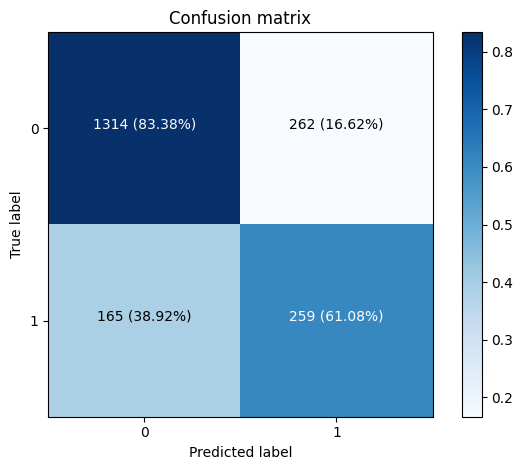

Model Accuracy: 78.65%
Model Precision: 49.71%
Model Recall: 61.08%
Model F1-Score: 54.81%
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      1479
           1       0.61      0.50      0.55       521

    accuracy                           0.79      2000
   macro avg       0.72      0.69      0.70      2000
weighted avg       0.78      0.79      0.78      2000

Accuracy for class 0: 0.83
Accuracy for class 1: 0.61


In [157]:
# Predicciones
y_pred_proba = model.predict(X_test)
y_pred = (y_pred_proba >= 0.5).astype(int)

metricas_matriz(y_test, y_pred)

A continuación dibujaremos curvas de aprendizaje para la precisión y la pérdida tanto en el conjunto de entrenamiento 
como en el de validación. Esto ayuda a identificar si el modelo está sobreajustando o subajustando.

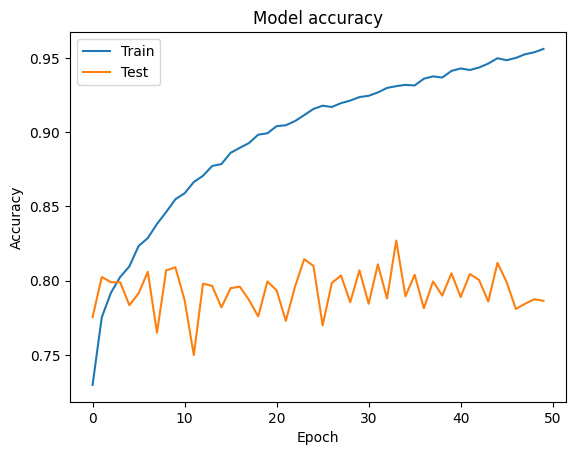

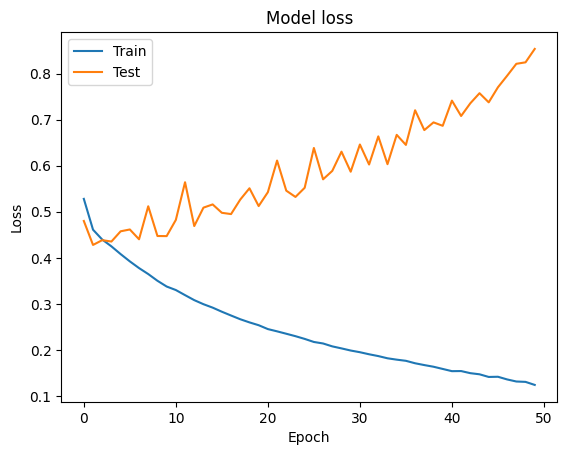

In [159]:
#Curvas de Aprendizaje

import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

Cómo podemos ver en la curca del Accuracy, el modelo tiene cierto sobreajuste, mejorando a medida que avanzan las epocas significativamente el rendimiento de la muestra de entrenamiento mientras la de test se mantiene estable en torno a un 0,80 de Accuracy.

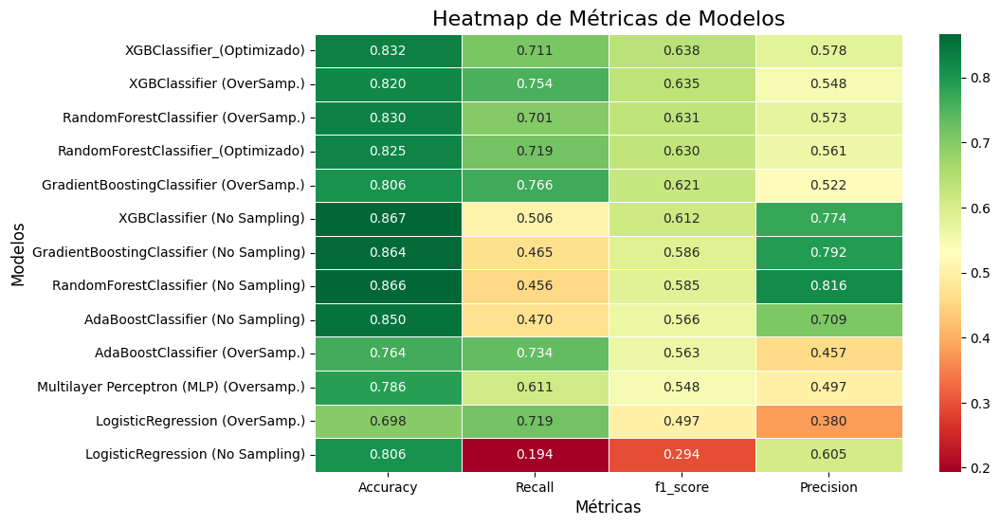

In [161]:
# Comparamos el MLP con los resultados de los otros modelos de ML

# Crear el heatmap sin incluir la columna 'Sampling'
plt.figure(figsize=(10, 6))
heatmap_data = df_Resultados.set_index('Modelo').drop(columns=['Sampling']).sort_values(by='f1_score', ascending=False)
sns.heatmap(heatmap_data, annot=True, cmap='RdYlGn', linewidths=.5, fmt='.3f')

# Configurar el título y las etiquetas
plt.title('Heatmap de Métricas de Modelos', fontsize=16)
plt.xlabel('Métricas', fontsize=12)
plt.ylabel('Modelos', fontsize=12)
plt.show()

Vemos que el MLP esta muy lejos de mejorar los rendimientos de los modelos de ML que hemos desarrollado anteriormente. Para ver si podemos mejorar el f1_score, buscaremos el therholds (probabilidad de corte para establecer Exited=1, esto es, cliente que abandona, que es por defecto 0,5).

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step


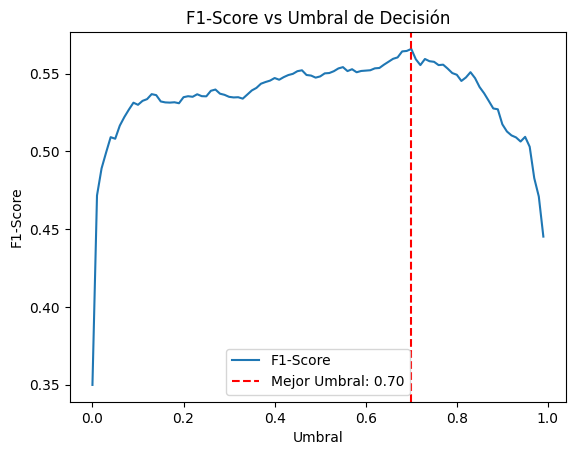

Mejor Umbral: 0.70
Mejor F1-Score: 0.57


In [163]:
#Ajuste del umbral de decisión: En lugar de usar un umbral de 0.5 para clasificar, 
#ajusta el umbral para encontrar un mejor equilibrio entre precisión y recall.

#calculamos el mejor umbral de decisión y el F1-Score correspondiente,
#además de generar un gráfico para visualizarlo:

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score

# Obtener las predicciones del modelo
y_pred = model.predict(X_test)

# Definir una función para calcular el F1-Score para diferentes umbrales
def calculate_f1_scores(y_test, y_pred):
    thresholds = np.arange(0.0, 1.0, 0.01)
    f1_scores = []
    for threshold in thresholds:
        y_pred_classes = (y_pred > threshold).astype("int32")
        f1 = f1_score(y_test, y_pred_classes)
        f1_scores.append(f1)
    return thresholds, f1_scores

# Calcular los F1-Scores para diferentes umbrales
thresholds, f1_scores = calculate_f1_scores(y_test, y_pred)

# Encontrar el mejor umbral y el F1-Score correspondiente
best_threshold = thresholds[np.argmax(f1_scores)]
best_f1_score = max(f1_scores)

# Generar el gráfico
plt.plot(thresholds, f1_scores, label='F1-Score')
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Mejor Umbral: {best_threshold:.2f}')
plt.xlabel('Umbral')
plt.ylabel('F1-Score')
plt.title('F1-Score vs Umbral de Decisión')
plt.legend()
plt.show()

print(f'Mejor Umbral: {best_threshold:.2f}')
print(f'Mejor F1-Score: {best_f1_score:.2f}')


63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step


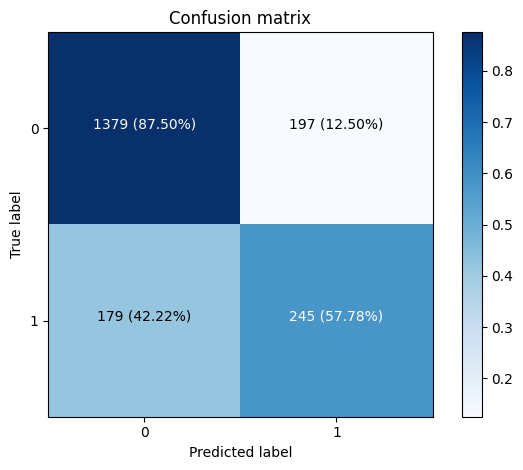

Model Accuracy: 81.20%
Model Precision: 55.43%
Model Recall: 57.78%
Model F1-Score: 56.58%
              precision    recall  f1-score   support

           0       0.88      0.89      0.88      1558
           1       0.58      0.55      0.57       442

    accuracy                           0.81      2000
   macro avg       0.73      0.72      0.72      2000
weighted avg       0.81      0.81      0.81      2000

Accuracy for class 0: 0.88
Accuracy for class 1: 0.58


In [165]:
import itertools

# Obtener las predicciones del modelo
y_pred = model.predict(X_test)
# Ajustar el umbral de decisión
threshold = best_threshold
y_pred_classes = (y_pred > threshold).astype("int32")

metricas_matriz(y_test, y_pred_classes)